# Script to plot radiosounding data

In [1]:
#read packages 

import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT, Hodograph
from metpy.units import units
import metpy.calc as mpcalc
from metpy.calc import cape_cin, dewpoint_from_relative_humidity, parcel_profile
from eccodes import codes_bufr_new_from_file, codes_set, codes_get_array, codes_release
import numpy as np
from pathlib import Path
import os
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

C:\Users\lotta\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
# create folder for plots
path = Path("weatherballoon_plots")
path.mkdir(parents=True, exist_ok=True)

## Function for reading the data

In [52]:
def get_data(date_sounding, time_sounding_utc): 
    dir_path = os.getcwd()  # current working directory

    print(dir_path)
    
    filename = os.path.join(dir_path, f"weatherballoon_data/{date_sounding}_{time_sounding_utc}_Bufr_309057_all.dat")
    
    data = {
    "airTemperature": [],
    "pressure": [],
    "dewpointTemperature": [],
    "windDirection": [],
    "windSpeed": []
    }

    with open(filename, 'rb') as f:
        while True:
            bufr = codes_bufr_new_from_file(f)
            if bufr is None:
                break
            try:
                codes_set(bufr, 'unpack', 1)
                for key in data:
                    try:
                        values = codes_get_array(bufr, key)
                        data[key].extend(values)
                    except Exception:
                        pass
            except Exception as e:
                print("Skipping message:", e)
            finally:
                codes_release(bufr)
        
    # Print first few entries
    for key in data:
        print(f"{key}: {data[key][:5]}")
        
    #Convert data: Pa to hPa, Kelvin to °C
    pressure = np.array(data["pressure"]) * 0.01 * units.hPa  # Convert from Pa to hPa
    temperature = (np.array(data["airTemperature"]) - 273.15) * units.degC
    dewpoint = (np.array(data["dewpointTemperature"]) - 273.15) * units.degC

    wind_speed = np.array(data['windSpeed']) * units('m/s')
    wind_dir = np.array(data['windDirection']) * units.degree

    # Calculate directional components of wind 
    u_wind = -wind_speed * np.sin(np.radians(wind_dir.m))
    v_wind = -wind_speed * np.cos(np.radians(wind_dir.m))

    # Sometimes the pressure array is longer by exactly one element
    # in that case, we remove the last element
    if len(pressure.m) == len(temperature.m) + 1 == len(dewpoint.m) + 1:
        pressure = pressure[:-1]  # exclude last element
    else:
        pressure = pressure

    # Extract missing values 
    mask = (
        np.isfinite(pressure.m) &
        np.isfinite(temperature.m) &
        np.isfinite(dewpoint.m) &
        (pressure.m > 50) &
        (pressure.m < 1100)
    )

    pressure = pressure[mask]
    temperature = temperature[mask]
    dewpoint = dewpoint[mask]

    sort_idx = np.argsort(pressure.m)[::-1]
    pressure = pressure[sort_idx]
    temperature = temperature[sort_idx]
    dewpoint = dewpoint[sort_idx]

    u_wind = u_wind[sort_idx]
    v_wind = v_wind[sort_idx]

    # Subsample
    barb_step = 20
    pressure_barb = pressure[::barb_step]
    u_barb = u_wind[::barb_step]
    v_barb = v_wind[::barb_step]
    
    return {
        "p": pressure, 
        "T": temperature, 
        "Td": dewpoint, 
        "p_barb": pressure_barb, 
        "u_barb": u_barb, 
        "v_barb": v_barb,
        "u_wind": u_wind, 
        "v_wind": v_wind        
    }

## Function for plotting a radiosonde profile

In [4]:
def plot_SkewT_logP(date_sounding, time_sounding_utc, cutOff100):
    
    data = get_data(date_sounding, time_sounding_utc)
    
    pressure=data["p"]
    temperature=data["T"]
    dewpoint=data["Td"]
    pressure_barb=data["p_barb"]
    u_barb=data["u_barb"]
    v_barb=data["v_barb"]
    
    # Plot
    fig = plt.figure(figsize=(9, 9))
    skew = SkewT(fig, rotation=45)

    skew.plot(pressure, temperature, 'r', linewidth=2, label='Temperature')
    skew.plot(pressure, dewpoint, 'g', linewidth=2, label='Dew Point')
    skew.plot_barbs(pressure_barb, u_barb, v_barb)

    if cutOff100==True: 
        upper_ylim=100
        upper_ylim_descr="cutoff_at_100hPa"
    else: 
        upper_ylim=min(pressure)
        upper_ylim_descr="all_data"
    
    skew.ax.set_ylim(1050, upper_ylim)
    skew.ax.set_xlim(-35, 35)
    #skew.ax.set_yscale('log')
    skew.ax.grid(True)
    
    skew.ax.xaxis.set_major_locator(MultipleLocator(10))
    skew.ax.xaxis.set_minor_locator(MultipleLocator(1))

    skew.ax.yaxis.set_major_locator(MultipleLocator(100))
    skew.ax.yaxis.set_minor_locator(MultipleLocator(50))
    
    # calculate lifting condensation level (LCL)
    lcl_pressure, lcl_temperature = mpcalc.lcl(pressure[0], temperature[0], dewpoint[0])
    
    # Plot LCL temperature as black dot
    skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black', label='LCL')
    

    # Calculate full parcel profile and add to plot as black line
    prof = mpcalc.parcel_profile(pressure, temperature[0], dewpoint[0]).to('degC')
    skew.plot(pressure, prof, 'k', linewidth=2, label='parcel profile')
    

    # Shade areas of CAPE and CIN
    skew.shade_cin(pressure, temperature, prof, dewpoint)
    skew.shade_cape(pressure, temperature, prof)
    
    
    # Add the relevant special lines
    skew.plot_dry_adiabats(label='dry adiabats', alpha=0.2)
    skew.plot_moist_adiabats(label='moist adiabats', alpha=0.2)
    skew.plot_mixing_lines(label='mixing lines', alpha=0.2)
    
    skew.ax.legend()

    plt.xlabel("Temperature [°C]")
    plt.ylabel("Pressure [hPa]")
    
    try:
        cape, cin = cape_cin(pressure, temperature, dewpoint, prof)
    except ValueError as e:
        # Handle the error: log, skip, or set to None/default
        print(f"Error in CAPE/CIN calculation: {e}")
        cape, cin = None, None  # or any default handling
      
    
    cape_str = f"{cape:.1f}" if cape is not None else "N/A"
    cin_str = f"{cin:.1f}" if cin is not None else "N/A"


    plt.title(f'Skew-T log-P: {date_sounding} at {time_sounding_utc}\nCAPE: {cape_str}, CIN: {cin_str}')

    """
    # Create a hodograph
    # Create an inset axes object that is 40% width and height of the
    # figure and put it in the upper right hand corner.
    ax_hod = inset_axes(skew.ax, '30%', '30%', loc=1)
    h = Hodograph(ax_hod, component_range=80.)
    h.add_grid(increment=20)
    h.plot_colormapped(u_wind, v_wind, wind_speed)  # Plot a line colored by wind speed
    """

    plt.tight_layout()
    plt.savefig('weatherballoon_plots/SkewT_logP_'+date_sounding+'_'+time_sounding_utc+'_'+upper_ylim_descr+'.png')
    plt.show()

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.65000000000003, 296.8, 296.3, 296.2, 295.83]
pressure: [101546, 100771, 100117, 100000, 99517]
dewpointTemperature: [295.35, 295.45, 295.35, 295.31, 294.95]
windDirection: [190, 198, 204, 204, 203]
windSpeed: [2.5, 2.1, 2.3000000000000003, 2.2, 1.8]


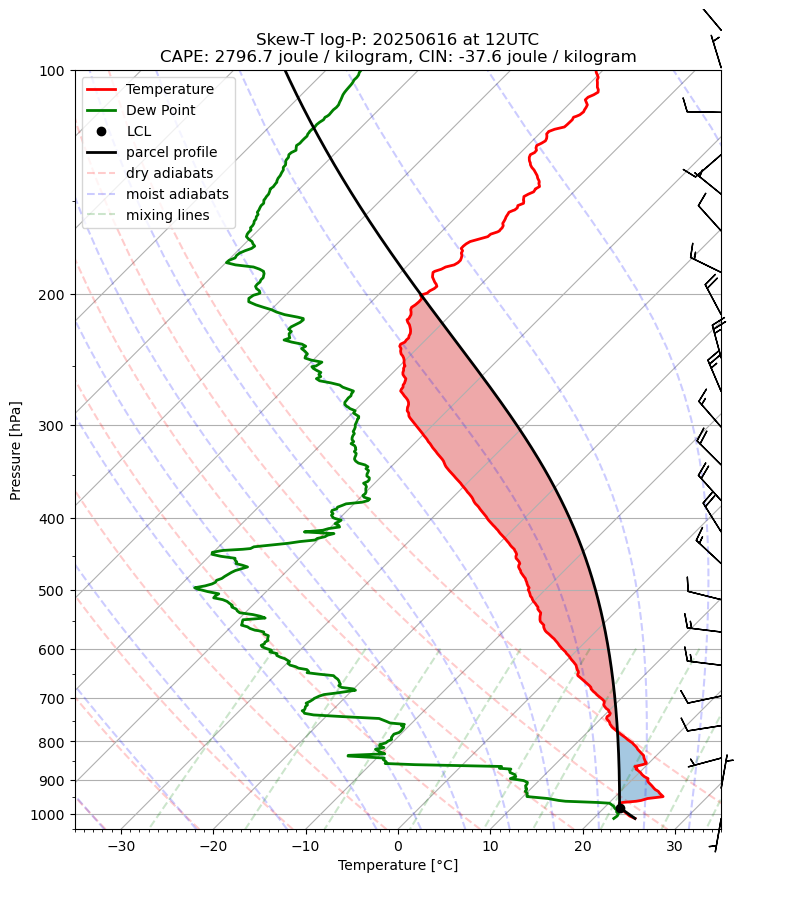

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [294.25, 295.35, 293.96, 293.72, 293.35]
pressure: [102006.0, 101795.0, 101578.0, 101313.0, 100887.0]
dewpointTemperature: [290.08, 289.89, 290.04, 289.39, 289.40000000000003]
windDirection: [20, 26, 27, 23, 22]
windSpeed: [8.0, 6.800000000000001, 6.7, 7.6000000000000005, 8.6]


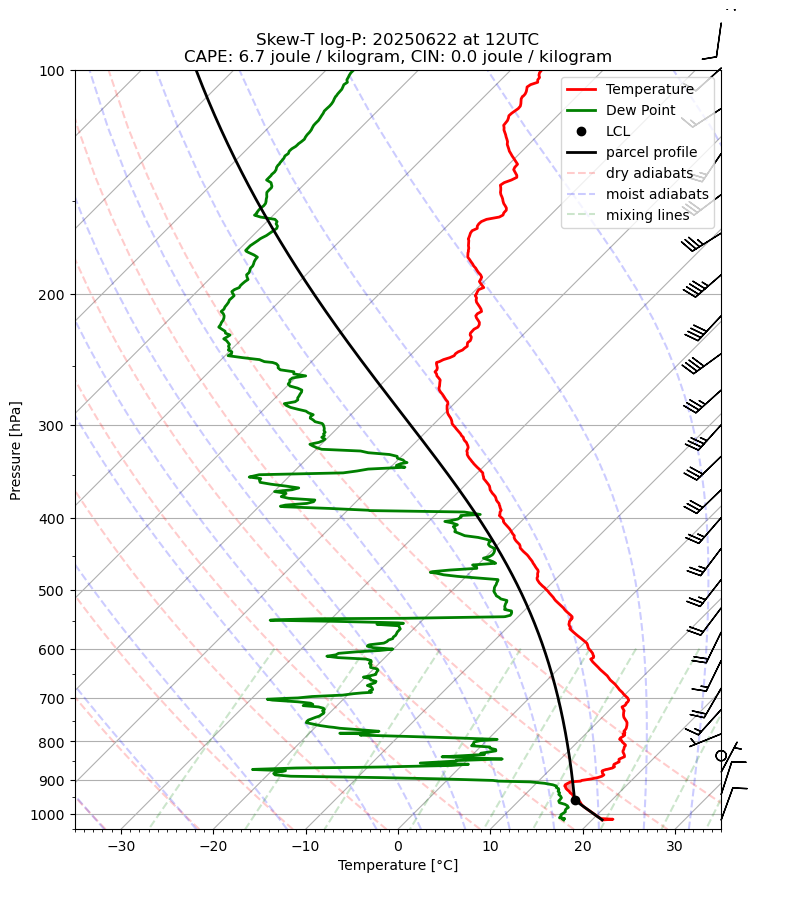

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [294.45, 295.37, 293.83, 293.74, 293.24]
pressure: [102116.0, 101911.0, 101469.0, 101347.0, 100752.0]
dewpointTemperature: [289.86, 290.64, 288.96, 288.89, 288.76]
windDirection: [30, 32, 27, 26, 25]
windSpeed: [8.5, 6.2, 6.800000000000001, 7.0, 7.9]


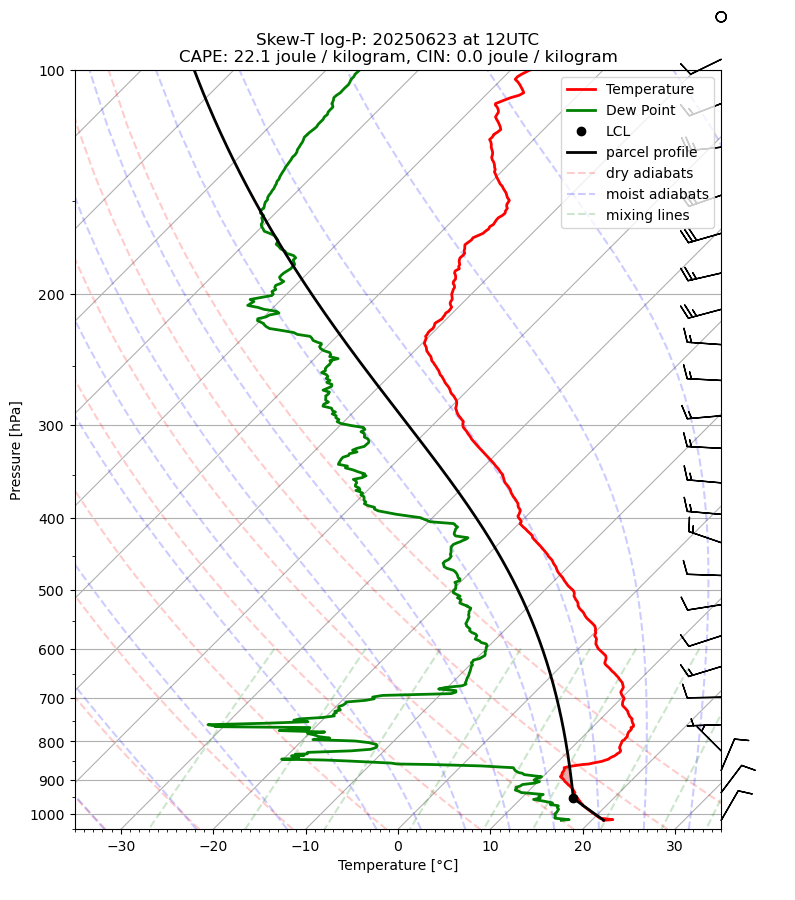

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [295.95, 295.24, 294.75, 294.36, 294.3]
pressure: [101846, 101049, 100475, 100000, 99909]
dewpointTemperature: [292.33, 291.96, 291.48, 291.35, 291.34000000000003]
windDirection: [30, 31, 30, 28, 28]
windSpeed: [10.0, 8.6, 9.1, 9.3, 9.3]


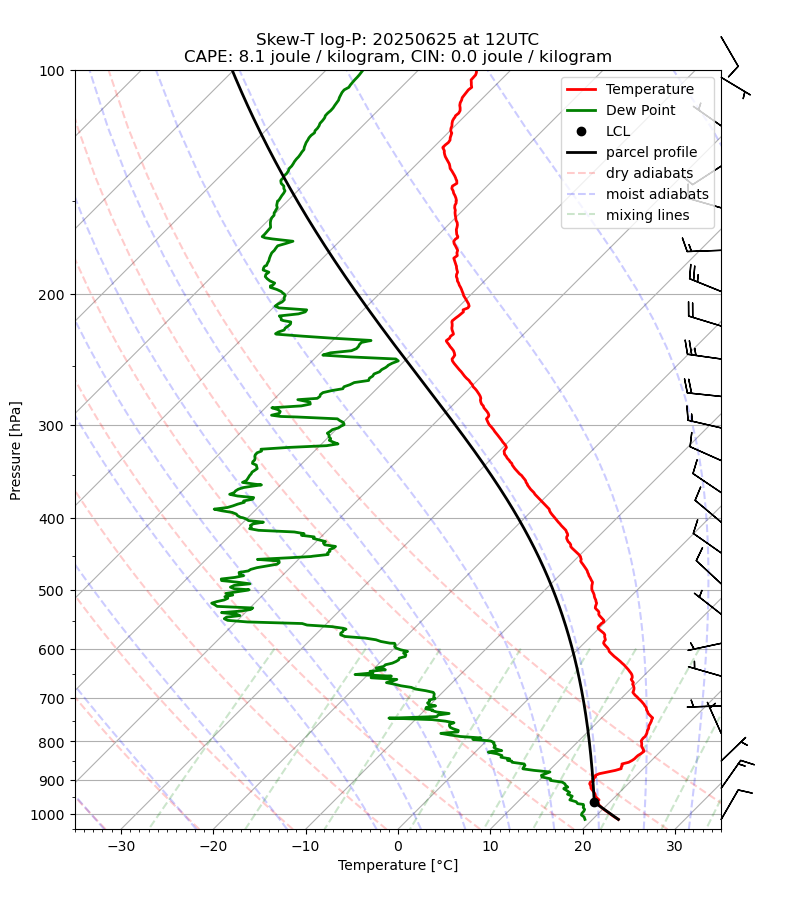

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [295.75, 295.34000000000003, 294.81, 294.49, 294.25]
pressure: [101836, 101024, 100372, 100000, 99733]
dewpointTemperature: [291.86, 291.5, 291.23, 291.22, 291.08]
windDirection: [30, 31, 30, 29, 28]
windSpeed: [7.5, 5.800000000000001, 7.0, 7.2, 7.4]


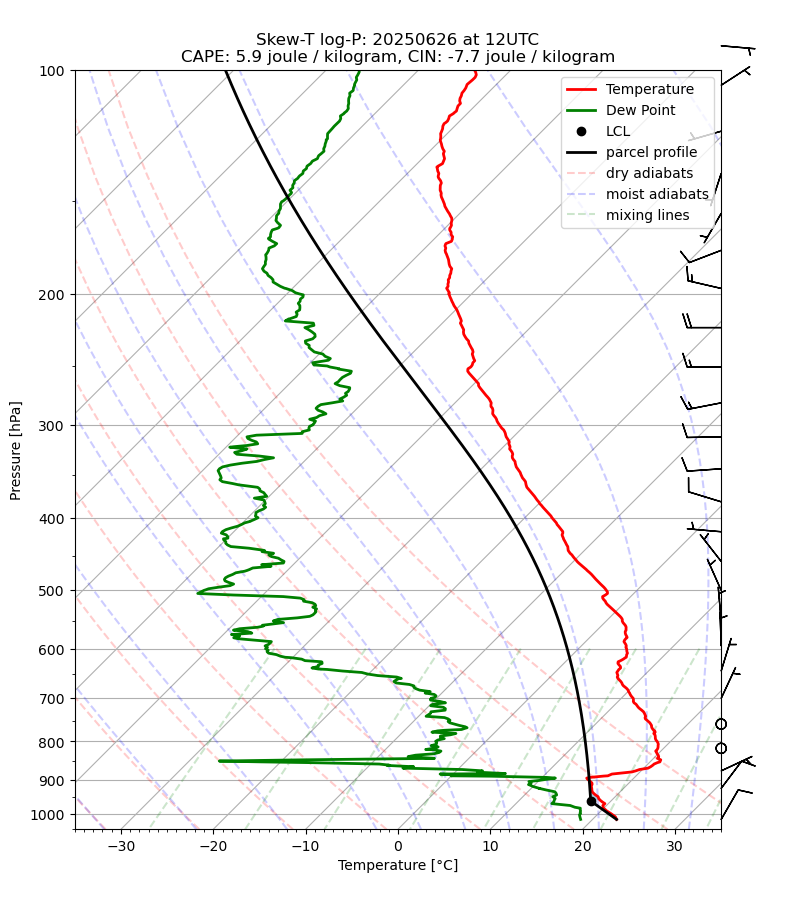

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [295.95, 295.48, 294.96, 294.56, 294.41]
pressure: [101896, 101069, 100462, 100000, 99818]
dewpointTemperature: [291.58, 290.74, 290.45, 290.47, 290.18]
windDirection: [45, 39, 36, 36, 36]
windSpeed: [10.0, 8.9, 9.8, 9.8, 9.700000000000001]


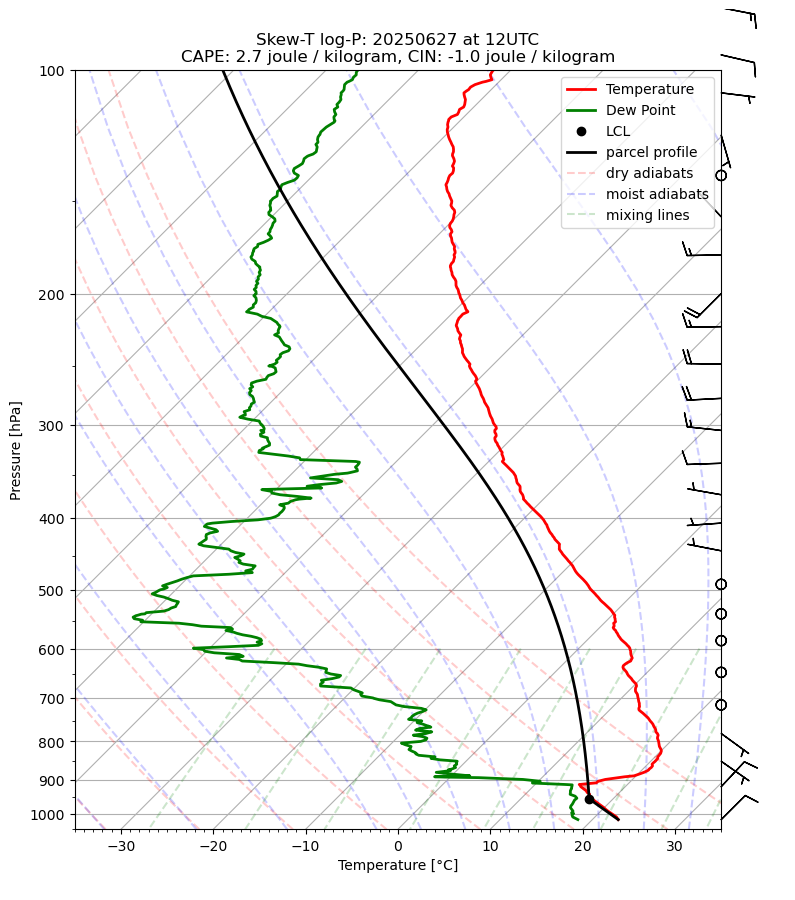

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [296.85, 296.42, 295.89, 295.43, 295.40000000000003]
pressure: [101946, 101159, 100529, 100000, 99957]
dewpointTemperature: [291.68, 290.41, 289.92, 289.82, 289.72]
windDirection: [60, 63, 61, 61, 61]
windSpeed: [11.0, 8.3, 9.4, 9.5, 9.5]


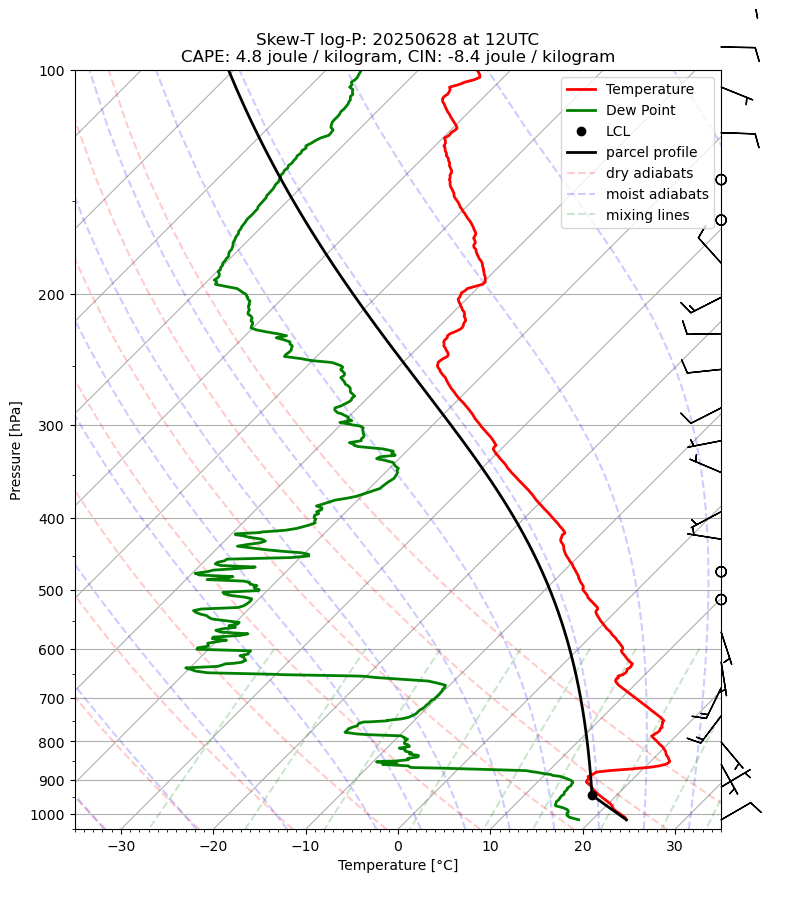

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [296.95, 296.55, 296.07, 295.57, 295.54]
pressure: [102066, 101206, 100624, 100051, 100000]
dewpointTemperature: [292.53000000000003, 291.85, 291.36, 291.29, 291.31]
windDirection: [85, 80, 80, 81, 81]
windSpeed: [5.0, 6.6000000000000005, 7.800000000000001, 7.9, 7.9]


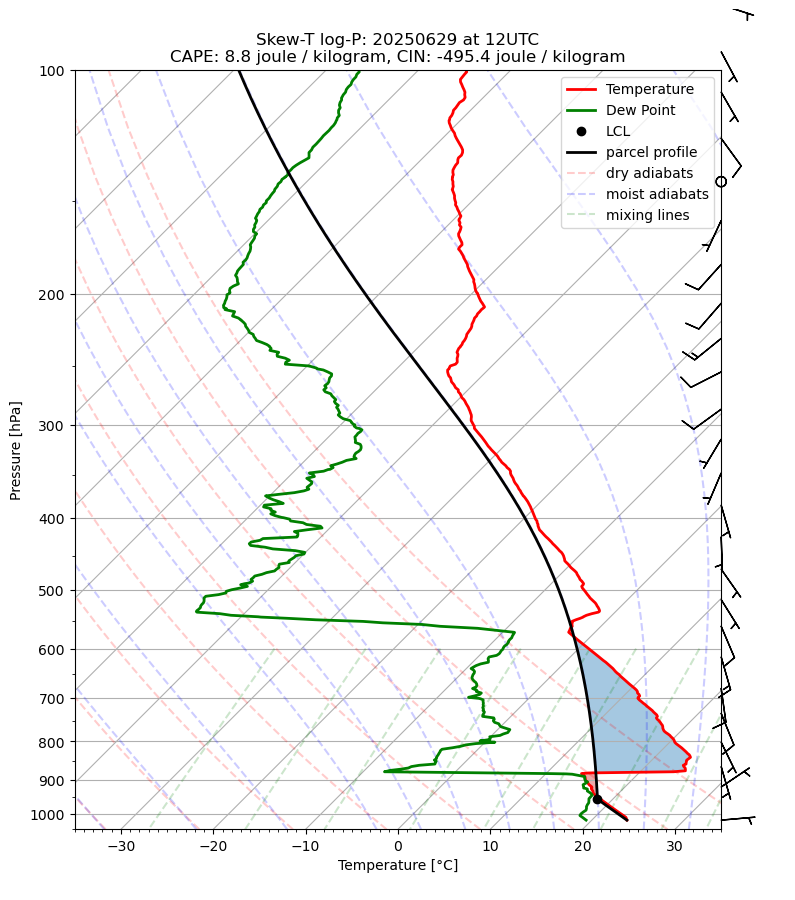

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.05, 296.62, 296.21, 296.15000000000003, 295.67]
pressure: [102136, 101446, 100973, 100917, 100339]
dewpointTemperature: [292.37, 290.45, 290.21, 290.18, 290.12]
windDirection: [61, 50, 47, 47, 47]
windSpeed: [10.0, 8.8, 9.700000000000001, 9.700000000000001, 9.700000000000001]


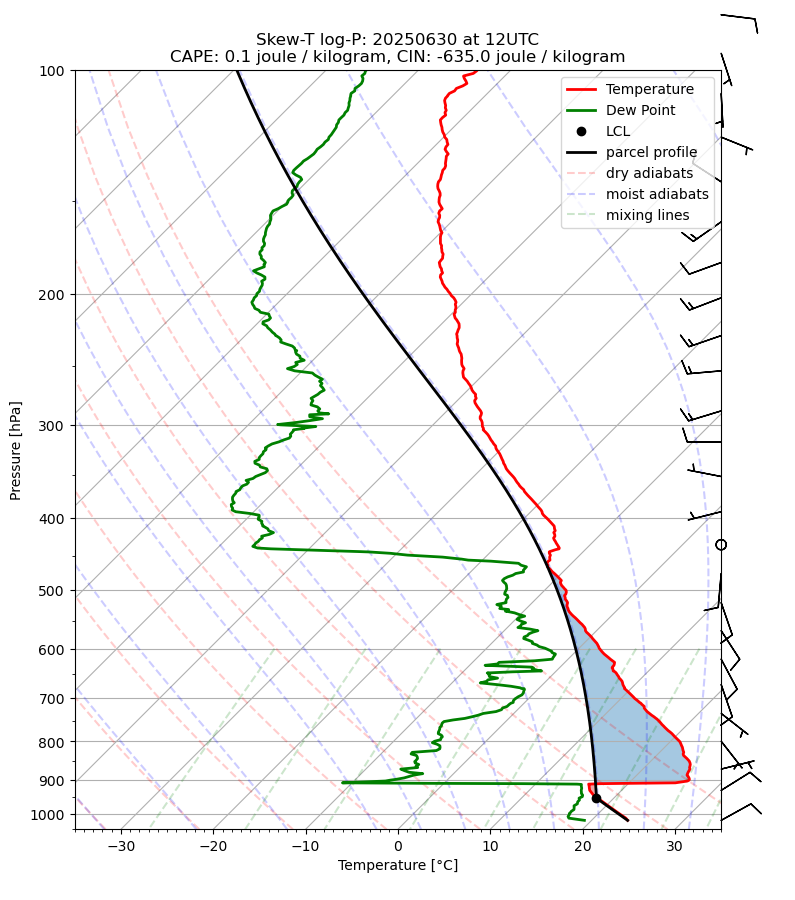

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.65000000000003, 297.17, 296.72, 296.25, 296.04]
pressure: [102186, 101352, 100809, 100234, 100000]
dewpointTemperature: [293.99, 292.53000000000003, 292.37, 292.29, 292.19]
windDirection: [70, 76, 74, 74, 76]
windSpeed: [9.5, 7.9, 8.6, 8.700000000000001, 8.700000000000001]


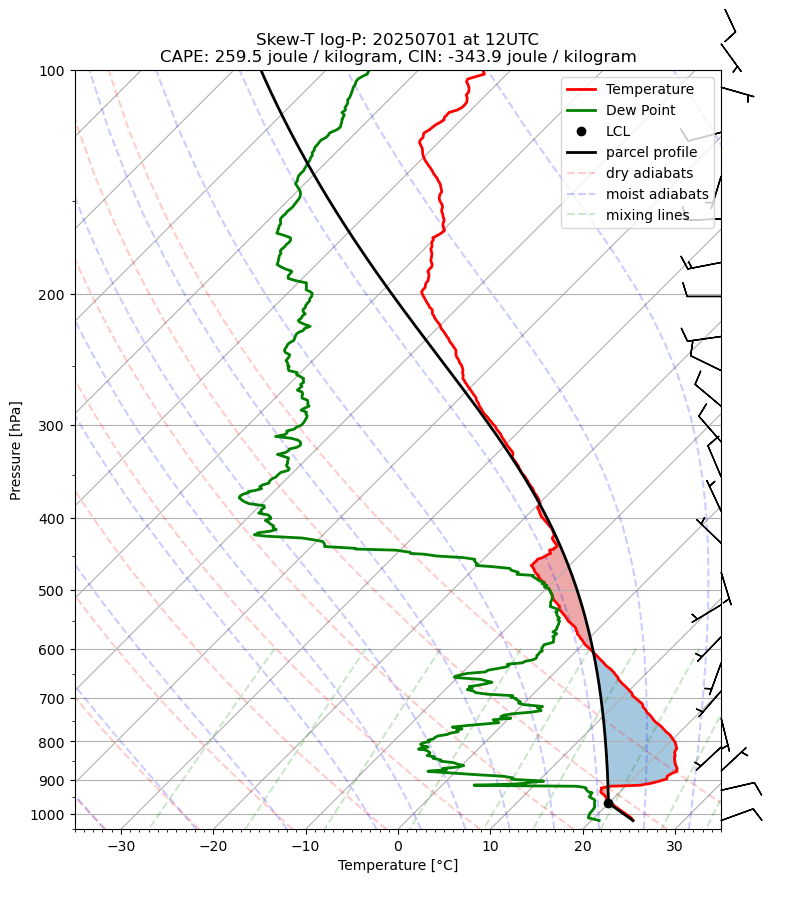

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.65000000000003, 297.53000000000003, 297.35, 297.02, 296.51]
pressure: [102186, 101357, 101117, 100748, 100120]
dewpointTemperature: [294.47, 292.98, 292.57, 292.53000000000003, 292.39]
windDirection: [82, 98, 96, 93, 91]
windSpeed: [5.0, 4.4, 5.1000000000000005, 6.0, 6.7]


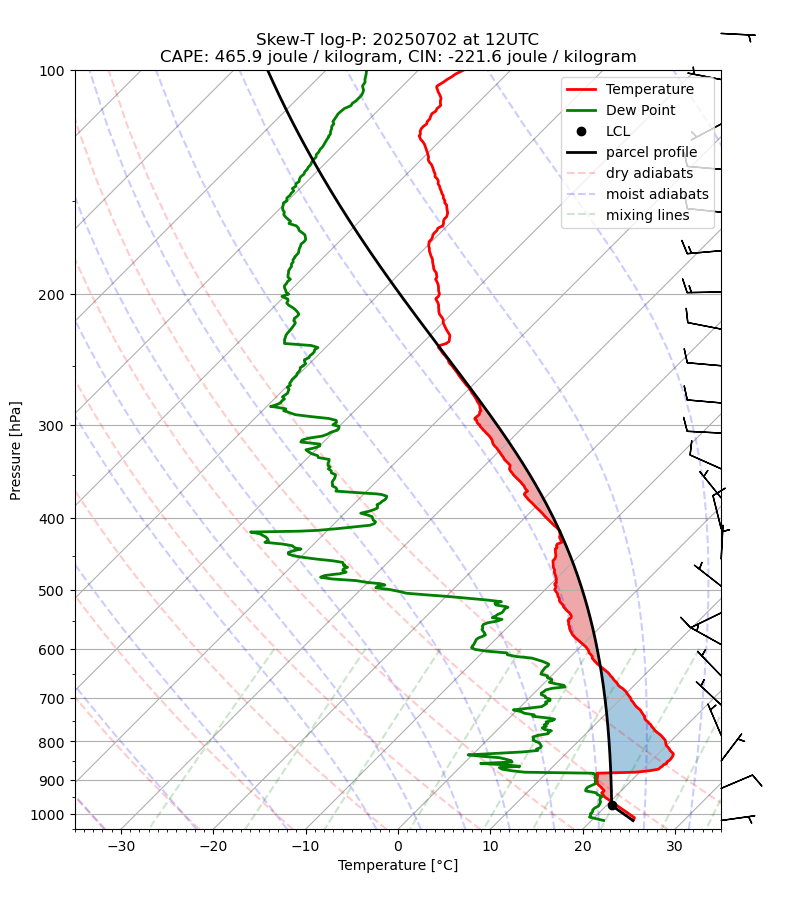

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.65000000000003, 297.07, 296.59000000000003, 296.08, 295.91]
pressure: [102176, 101400, 100829, 100219, 100000]
dewpointTemperature: [294.01, 293.71, 293.57, 293.49, 293.44]
windDirection: [86, 77, 79, 83, 84]
windSpeed: [4.0, 3.5, 4.5, 5.0, 5.2]


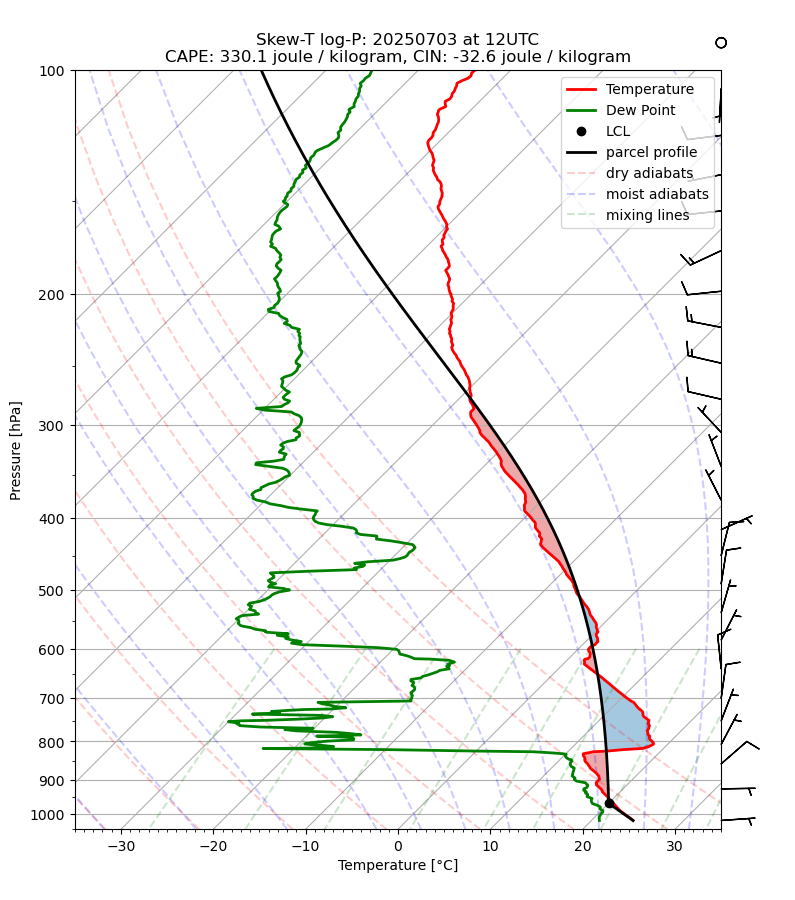

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.55, 297.18, 296.69, 296.23, 296.1]
pressure: [102056, 101267, 100698, 100144, 100000]
dewpointTemperature: [293.91, 293.35, 292.97, 292.89, 292.84000000000003]
windDirection: [55, 64, 65, 67, 67]
windSpeed: [5.5, 6.800000000000001, 8.200000000000001, 8.3, 8.200000000000001]


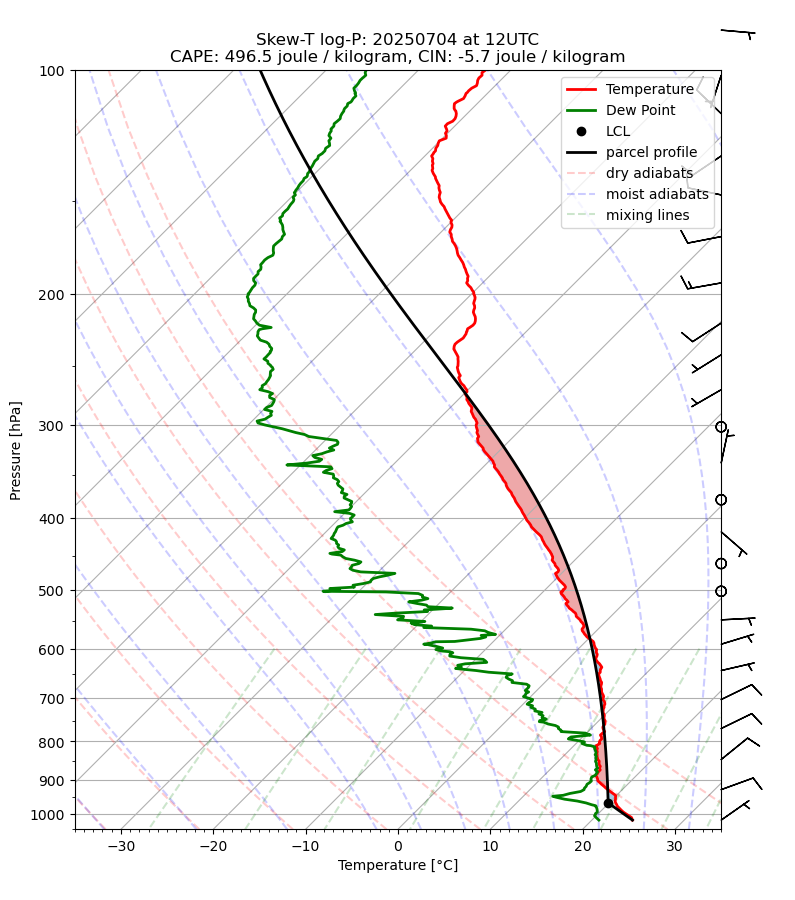

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.45, 297.35, 296.94, 296.44, 296.18]
pressure: [101846, 101473, 101105, 100520, 100221]
dewpointTemperature: [294.03000000000003, 293.96, 293.59000000000003, 293.44, 293.36]
windDirection: [58, 45, 55, 61, 63]
windSpeed: [7.0, 5.6000000000000005, 6.800000000000001, 7.800000000000001, 8.0]


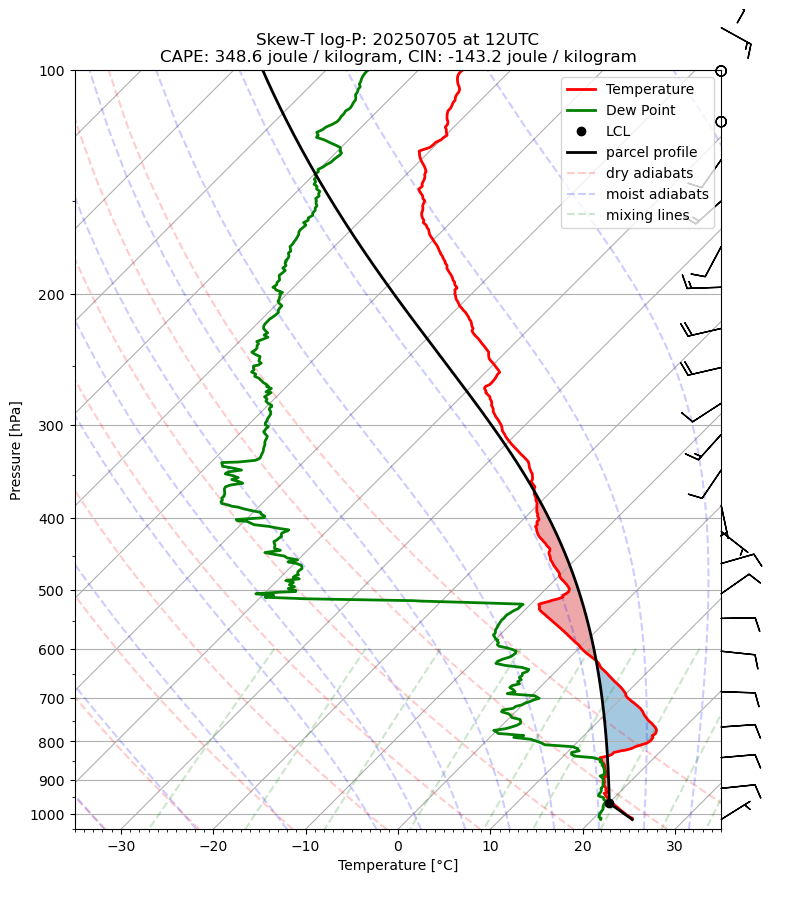

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.25, 297.81, 297.36, 296.93, 296.92]
pressure: [101726, 101046, 100513, 100000, 99988]
dewpointTemperature: [295.56, 295.19, 294.93, 294.87, 294.86]
windDirection: [80, 81, 82, 82, 82]
windSpeed: [6.5, 7.6000000000000005, 8.8, 8.4, 8.4]


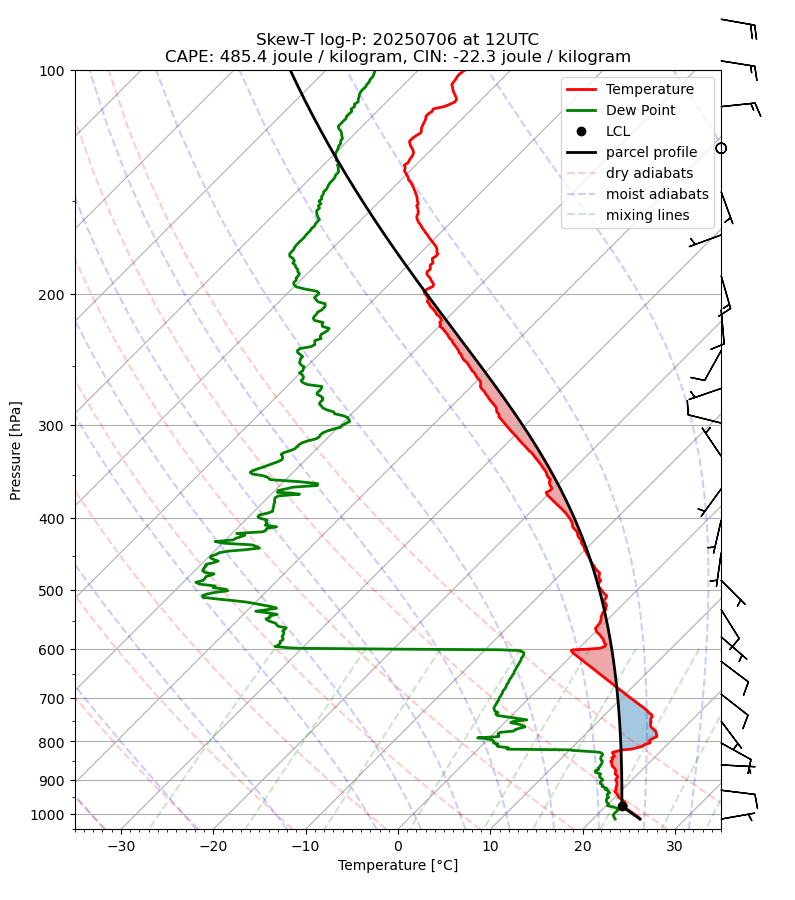

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.25, 298.2, 297.8, 297.32, 296.99]
pressure: [101766, 101463, 100978, 100421, 100000]
dewpointTemperature: [295.37, 295.42, 295.02, 294.94, 294.83]
windDirection: [50, 27, 39, 46, 48]
windSpeed: [6.0, 5.2, 5.4, 5.6000000000000005, 5.6000000000000005]


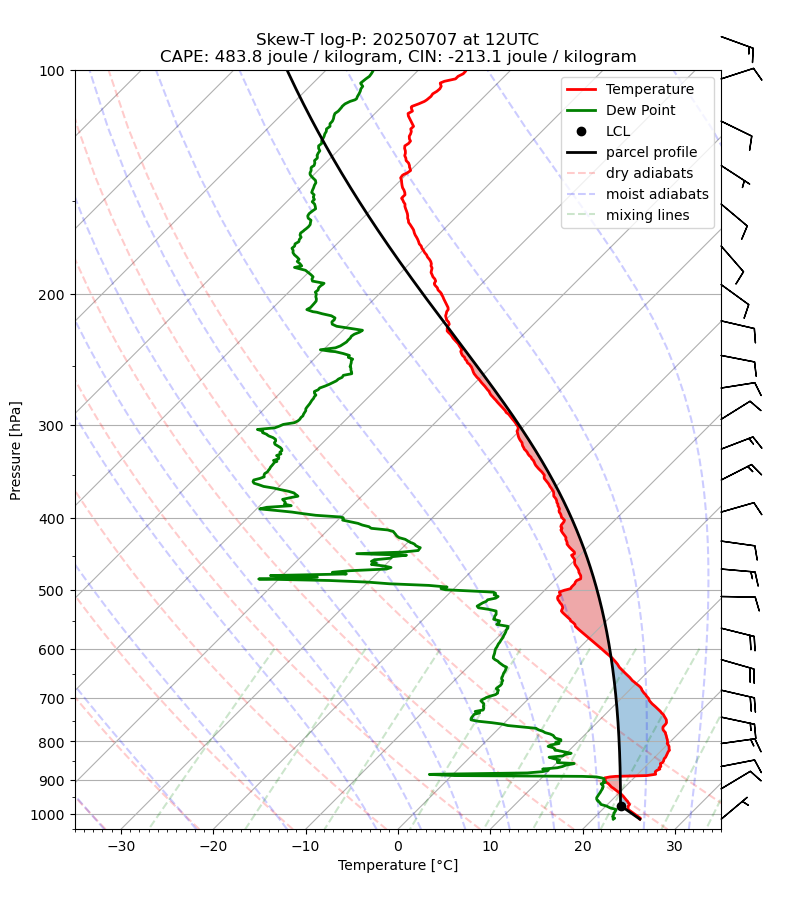

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.85, 297.64, 298.81, 298.41, 297.97]
pressure: [101566.0, 101406.0, 101318.0, 100864.0, 100334.0]
dewpointTemperature: [295.36, 294.66, 294.83, 294.35, 294.24]
windDirection: [60, 63, 66, 67, 67]
windSpeed: [9.0, 6.800000000000001, 5.800000000000001, 7.9, 9.8]


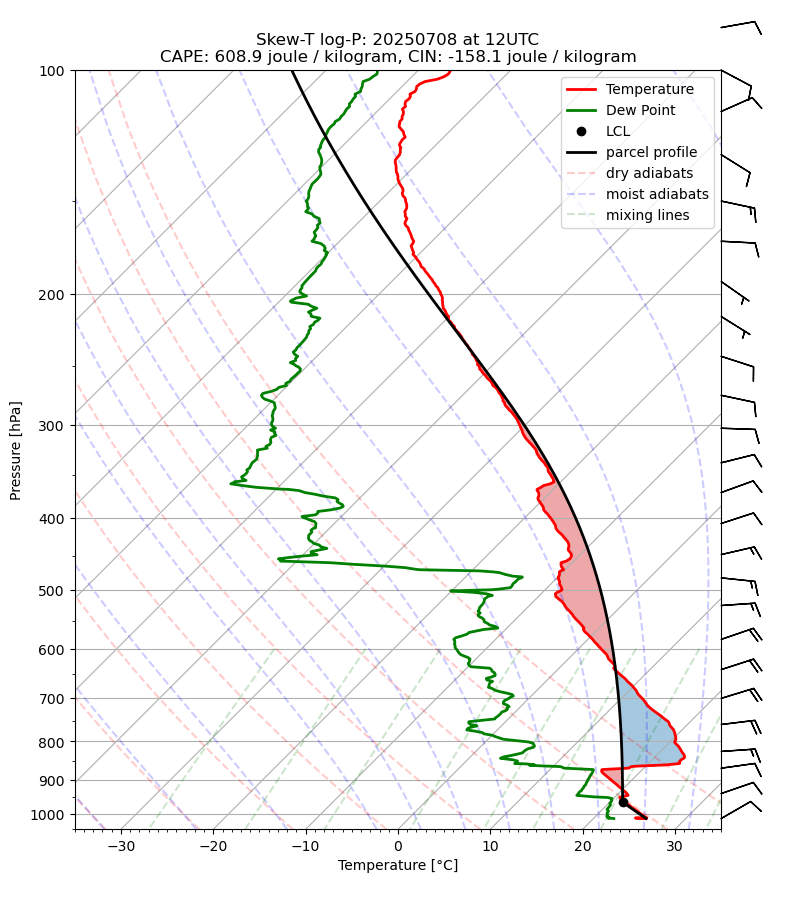

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.35, 298.3, 297.75, 297.36, 297.08]
pressure: [101576.0, 101241.0, 100831.0, 100345.0, 100000.0]
dewpointTemperature: [296.23, 296.52, 295.84000000000003, 295.59000000000003, 295.65000000000003]
windDirection: [50, 34, 42, 44, 44]
windSpeed: [8.5, 6.300000000000001, 7.4, 8.3, 8.3]


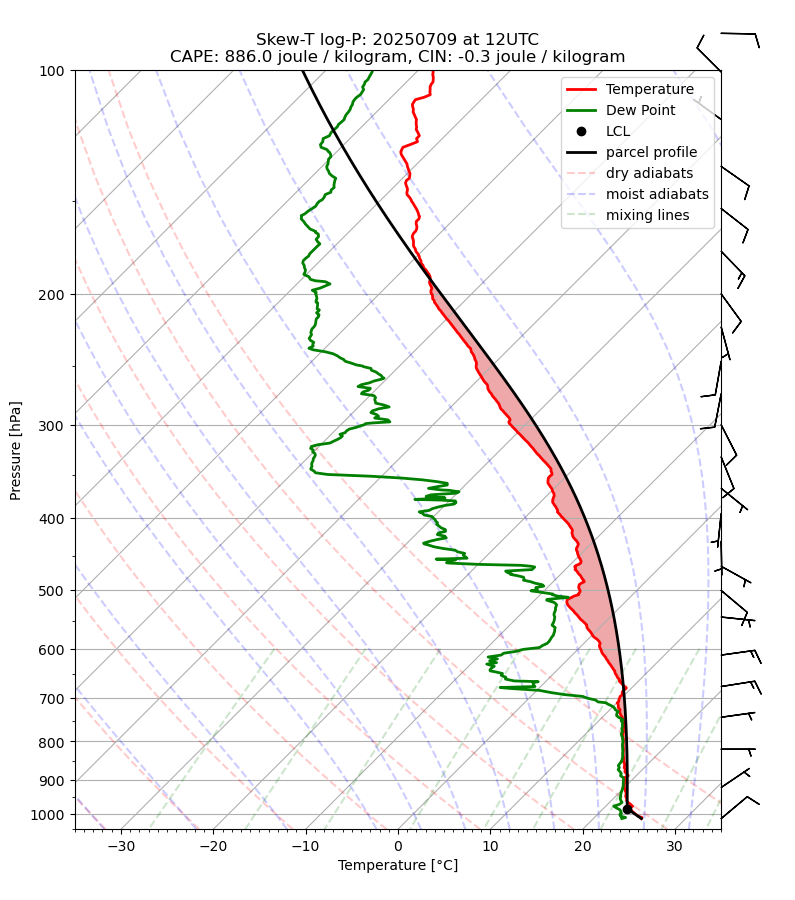

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 299.02, 298.67, 298.5, 298.29]
pressure: [101406, 100670, 100248, 100000, 99700]
dewpointTemperature: [297.12, 296.40000000000003, 296.29, 296.21, 296.21]
windDirection: [50, 54, 52, 51, 50]
windSpeed: [9.0, 7.6000000000000005, 9.0, 9.0, 9.0]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


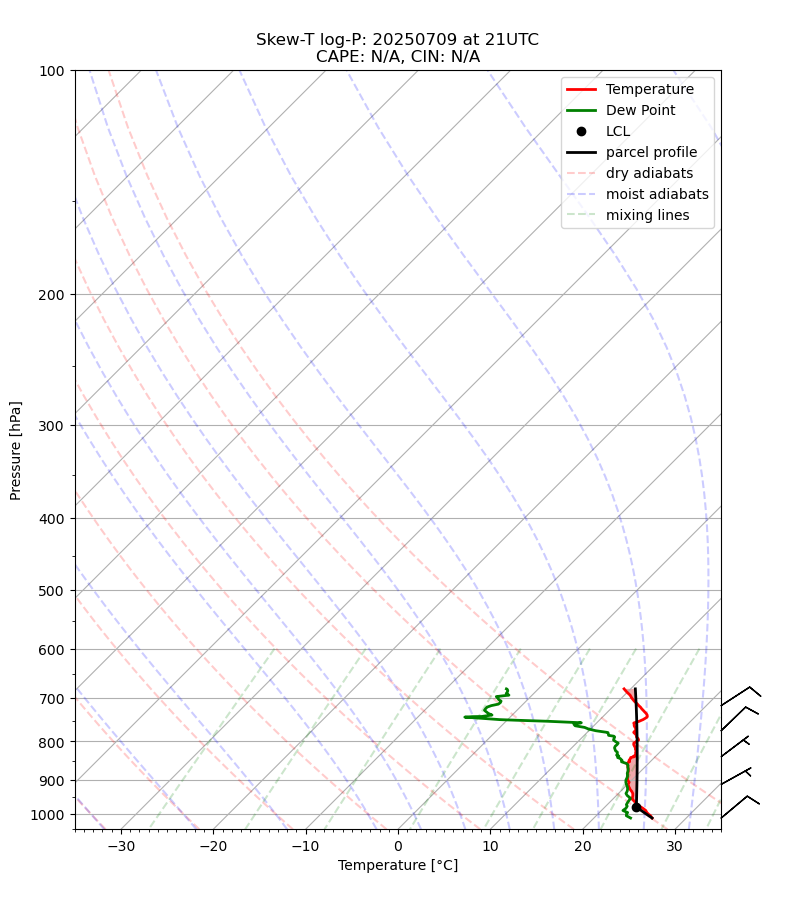

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 299.02, 298.67, 298.5, 298.29]
pressure: [101406, 100670, 100248, 100000, 99700]
dewpointTemperature: [297.12, 296.40000000000003, 296.29, 296.21, 296.21]
windDirection: [50, 54, 52, 51, 50]
windSpeed: [9.0, 7.6000000000000005, 9.0, 9.0, 9.0]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


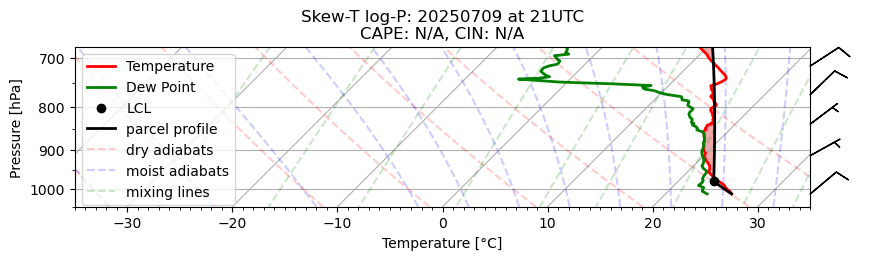

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.15000000000003, 299.22, 298.66, 298.15000000000003, 297.73]
pressure: [101556, 101335, 100949, 100491, 100018]
dewpointTemperature: [296.05, 295.34000000000003, 295.66, 295.48, 295.17]
windDirection: [40, 25, 29, 32, 33]
windSpeed: [8.0, 2.6, 5.7, 8.4, 9.1]


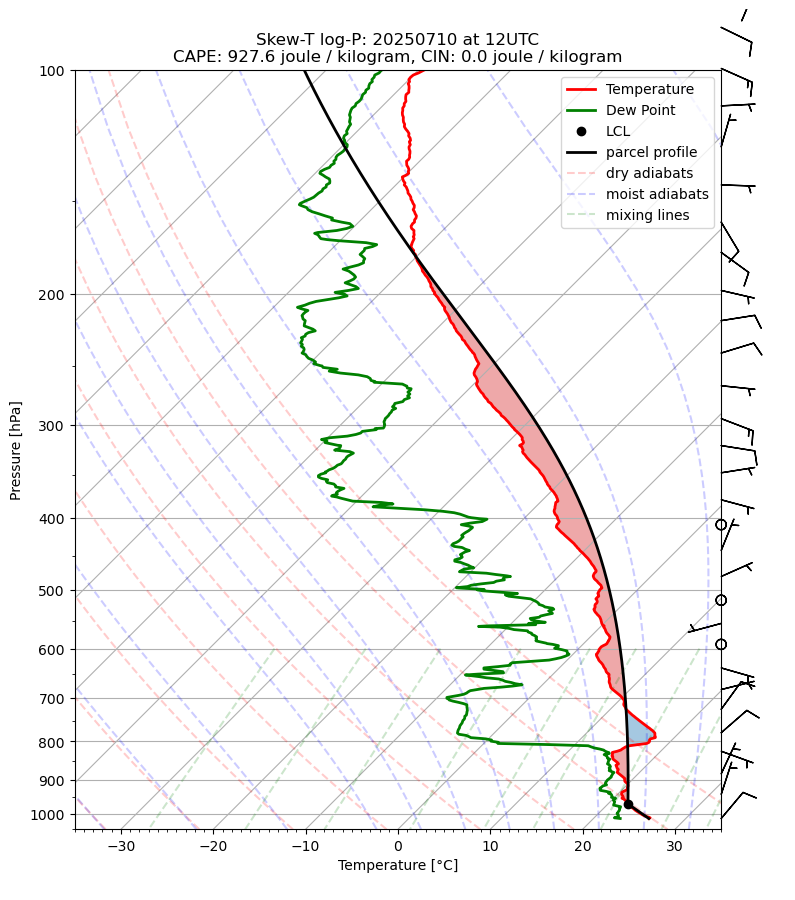

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 298.99, 298.24, 297.82, 297.71]
pressure: [101366, 100770, 100668, 100145, 100000]
dewpointTemperature: [297.88, 297.18, 296.84000000000003, 296.7, 296.77]
windDirection: [10, 15, 17, 24, 25]
windSpeed: [7.5, 6.4, 6.4, 6.5, 6.6000000000000005]


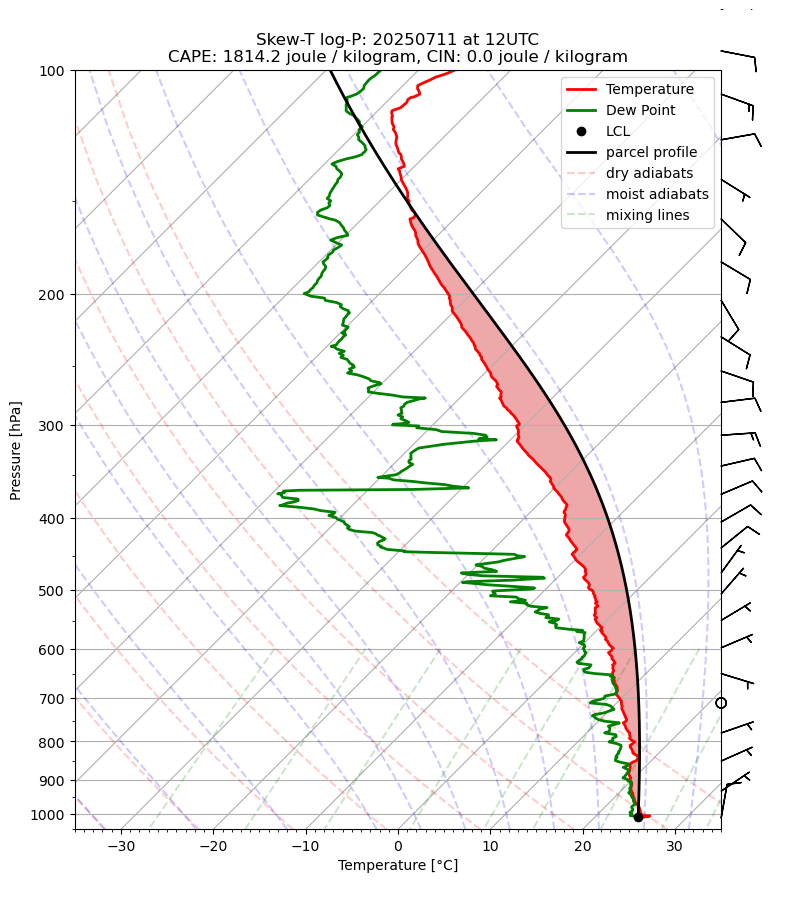

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 298.76, 298.29, 298.23, 297.71]
pressure: [101406.0, 100491.0, 100000.0, 99910.0, 99353.0]
dewpointTemperature: [297.72, 297.1, 297.07, 297.04, 296.90000000000003]
windDirection: [42, 352, 349, 348, 345]
windSpeed: [3.0, 3.2, 3.3000000000000003, 3.3000000000000003, 2.6]


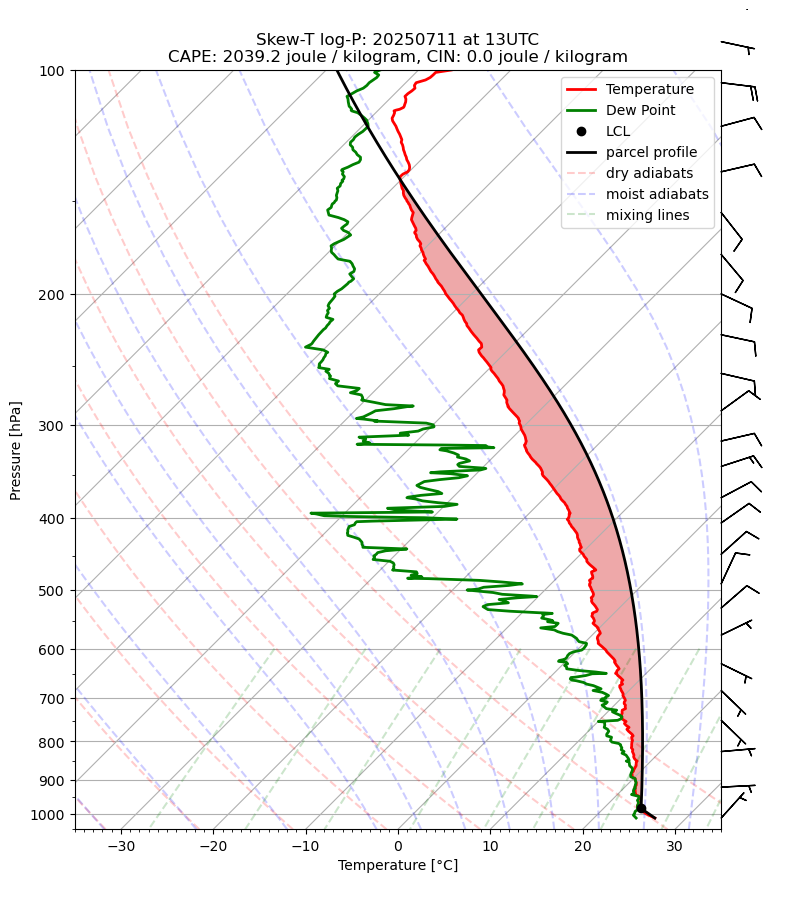

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.85, 299.31, 299.31, 299.25, 299.12]
pressure: [101386.0, 100762.0, 100349.0, 100221.0, 100000.0]
dewpointTemperature: [296.73, 296.03000000000003, 294.75, 294.55, 294.63]
windDirection: [110, 103, 109, 114, 122]
windSpeed: [3.5, 2.2, 2.3000000000000003, 2.2, 2.0]


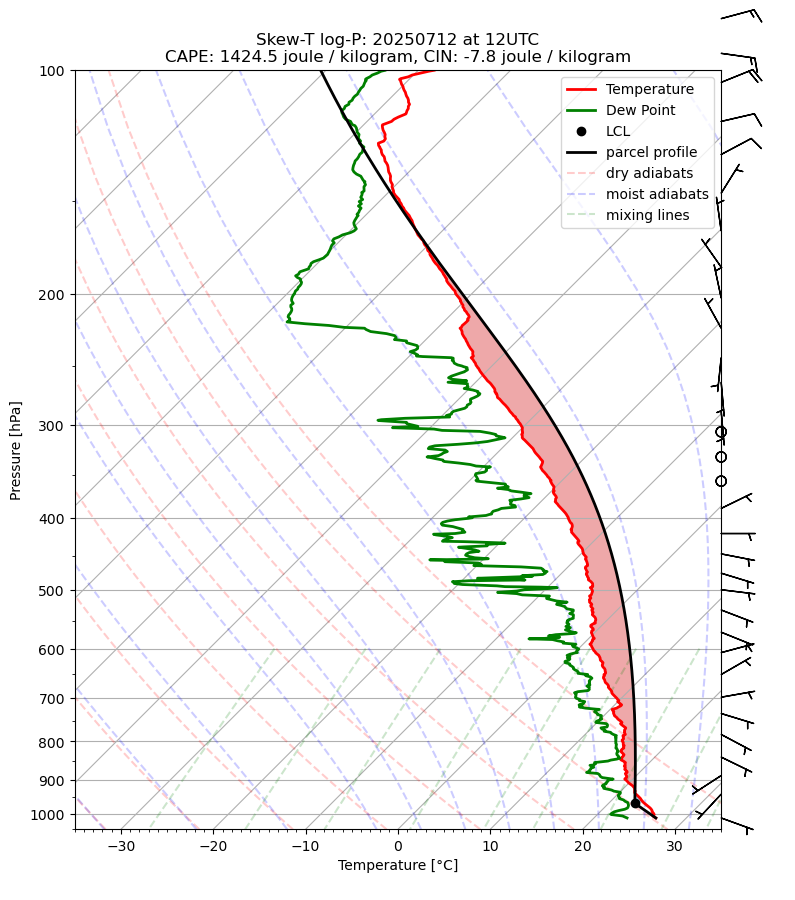

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.95, 297.8, 297.35, 297.13, 296.89]
pressure: [101466, 100773, 100256, 100000, 99773]
dewpointTemperature: [295.93, 295.66, 295.55, 295.5, 295.45]
windDirection: [302, 300, 302, 302, 301]
windSpeed: [4.0, 3.3000000000000003, 4.2, 4.3, 4.5]


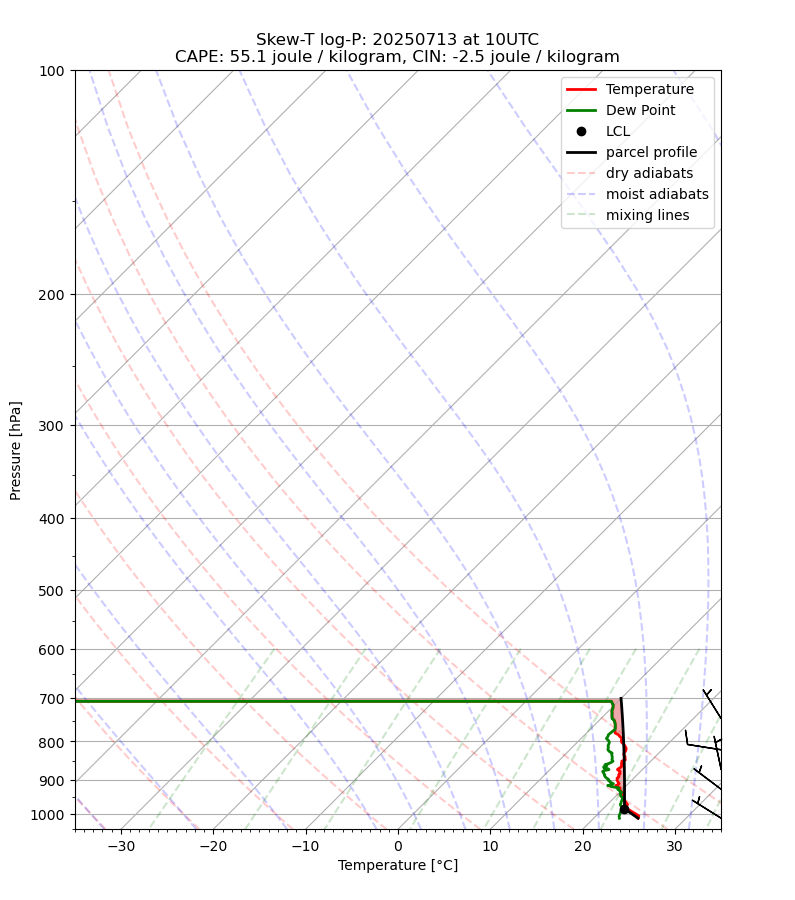

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.95, 297.8, 297.35, 297.13, 296.89]
pressure: [101466, 100773, 100256, 100000, 99773]
dewpointTemperature: [295.93, 295.66, 295.55, 295.5, 295.45]
windDirection: [302, 300, 302, 302, 301]
windSpeed: [4.0, 3.3000000000000003, 4.2, 4.3, 4.5]


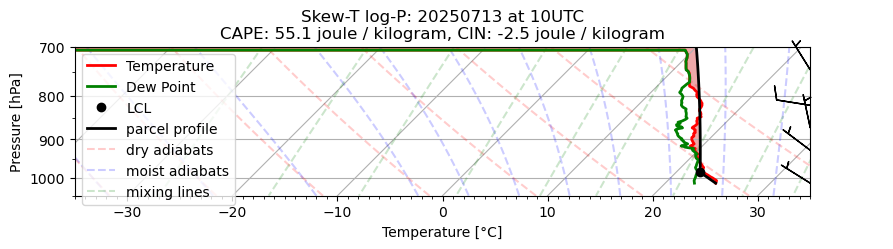

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 297.58, 297.0, 296.96, 296.54]
pressure: [101466, 100616, 100057, 100000, 99465]
dewpointTemperature: [296.81, 296.14, 295.5, 295.5, 295.12]
windDirection: [282, 271, 273, 273, 276]
windSpeed: [8.0, 5.1000000000000005, 6.0, 6.0, 6.300000000000001]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


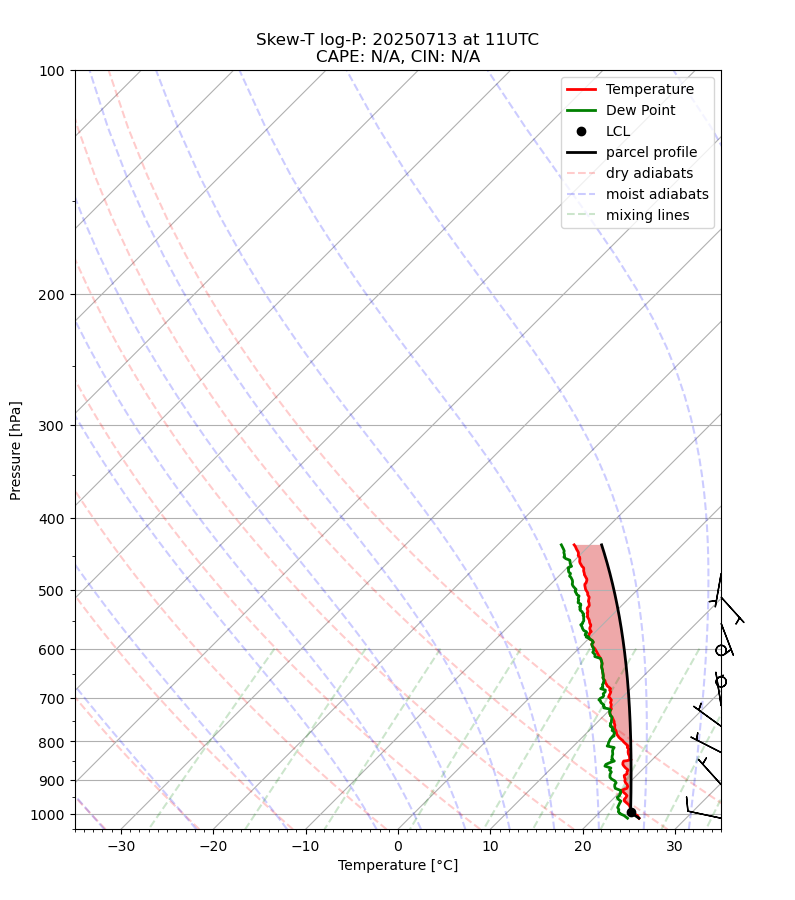

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 297.58, 297.0, 296.96, 296.54]
pressure: [101466, 100616, 100057, 100000, 99465]
dewpointTemperature: [296.81, 296.14, 295.5, 295.5, 295.12]
windDirection: [282, 271, 273, 273, 276]
windSpeed: [8.0, 5.1000000000000005, 6.0, 6.0, 6.300000000000001]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


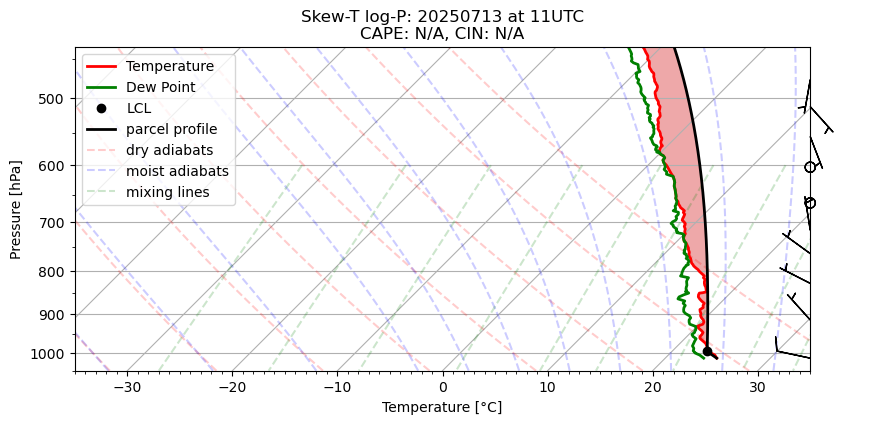

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [296.65000000000003, 296.63, 296.31, 296.06, 296.04]
pressure: [101586, 100823, 100363, 100000, 99921]
dewpointTemperature: [295.1, 293.82, 293.66, 293.74, 293.58]
windDirection: [260, 256, 259, 262, 262]
windSpeed: [8.0, 6.2, 7.5, 7.6000000000000005, 7.6000000000000005]


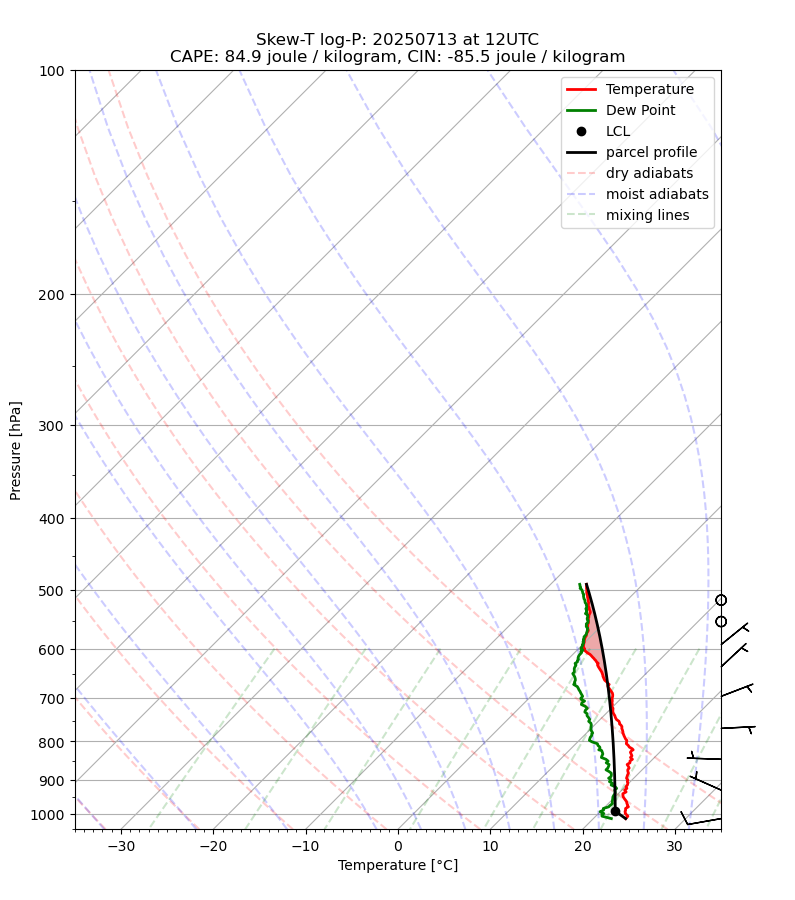

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [296.65000000000003, 296.63, 296.31, 296.06, 296.04]
pressure: [101586, 100823, 100363, 100000, 99921]
dewpointTemperature: [295.1, 293.82, 293.66, 293.74, 293.58]
windDirection: [260, 256, 259, 262, 262]
windSpeed: [8.0, 6.2, 7.5, 7.6000000000000005, 7.6000000000000005]


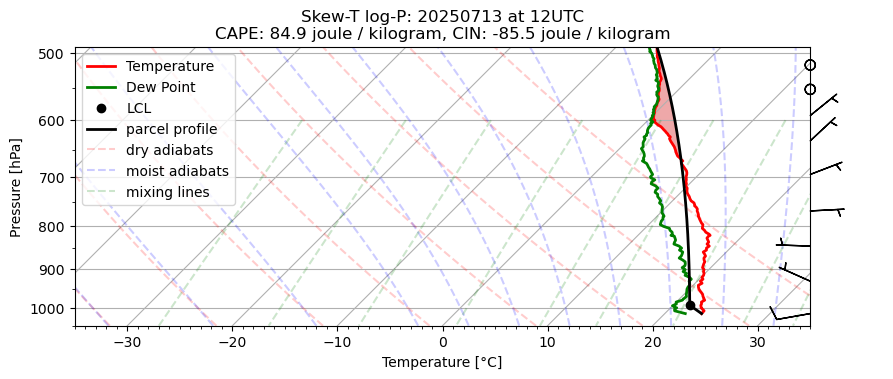

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [301.05, 299.38, 300.73, 301.21, 300.25]
pressure: [101526.0, 101305.0, 101171.0, 101049.0, 100739.0]
dewpointTemperature: [296.66, 296.25, 296.29, 296.3, 296.16]
windDirection: [20, 27, 31, 30, 25]
windSpeed: [4.0, 3.1, 2.7, 3.0, 3.4000000000000004]


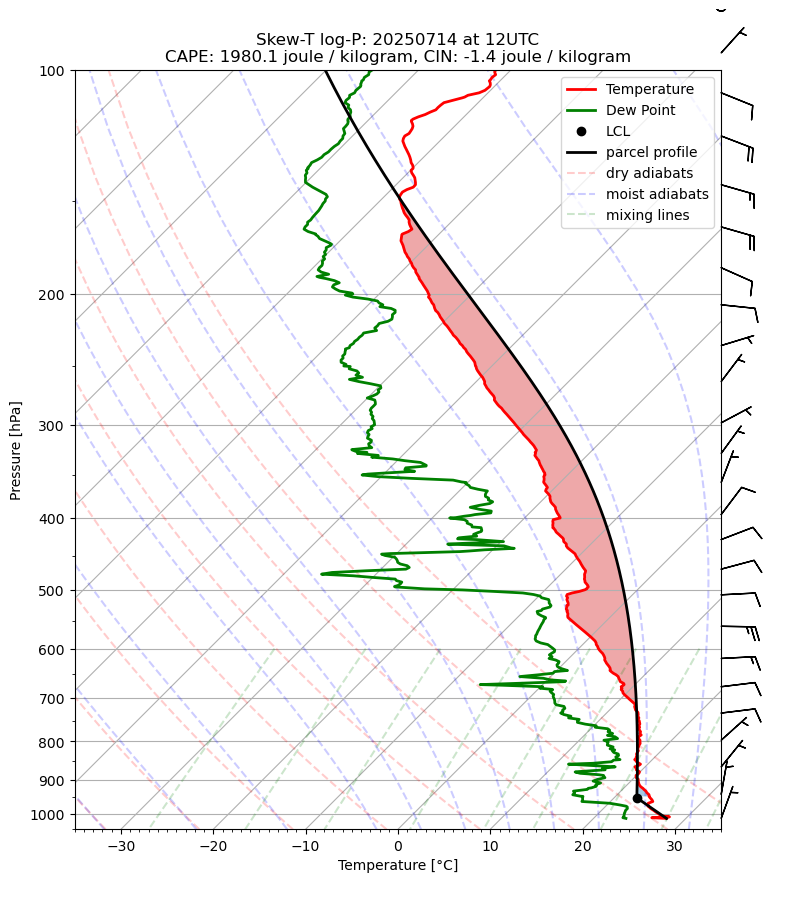

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.15000000000003, 298.68, 298.19, 298.18, 297.64]
pressure: [101386.0, 100596.0, 100010.0, 100000.0, 99378.0]
dewpointTemperature: [295.45, 294.79, 294.81, 294.81, 294.66]
windDirection: [110, 106, 104, 103, 102]
windSpeed: [5.5, 3.6, 4.4, 4.5, 4.800000000000001]


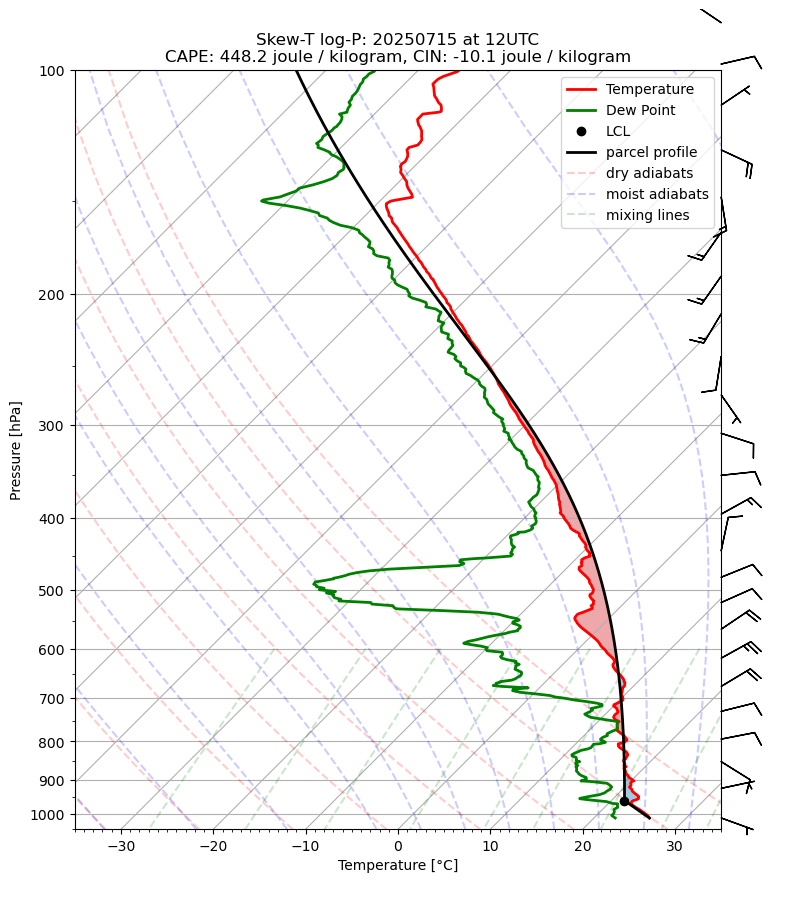

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.05, 299.6, 299.08, 299.08, 298.6]
pressure: [101386, 100596, 100000, 99999, 99537]
dewpointTemperature: [296.26, 296.04, 295.97, 295.97, 295.8]
windDirection: [207, 207, 202, 201, 201]
windSpeed: [3.0, 2.2, 2.6, 2.7, 2.7]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


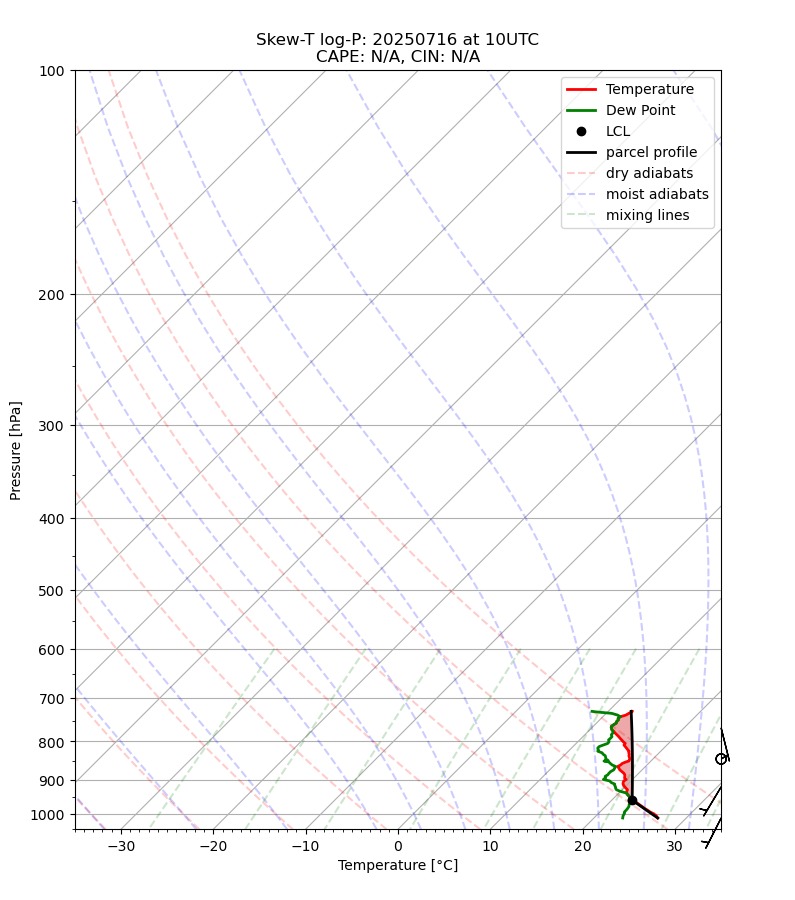

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.05, 299.6, 299.08, 299.08, 298.6]
pressure: [101386, 100596, 100000, 99999, 99537]
dewpointTemperature: [296.26, 296.04, 295.97, 295.97, 295.8]
windDirection: [207, 207, 202, 201, 201]
windSpeed: [3.0, 2.2, 2.6, 2.7, 2.7]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


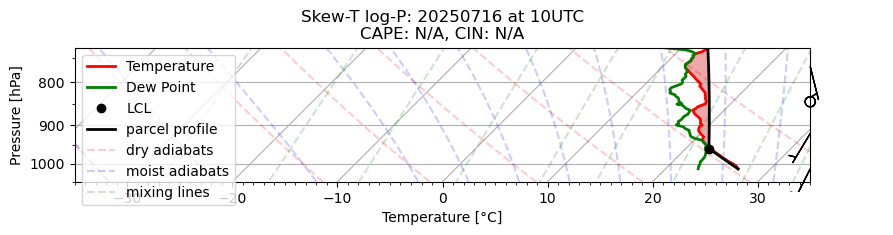

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 298.65000000000003, 298.51, 298.25, 298.17]
pressure: [101396, 100532, 100342, 100104, 100000]
dewpointTemperature: [297.2, 297.07, 297.02, 296.87, 296.82]
windDirection: [180, 162, 162, 164, 166]
windSpeed: [5.5, 4.6000000000000005, 5.1000000000000005, 5.6000000000000005, 5.7]


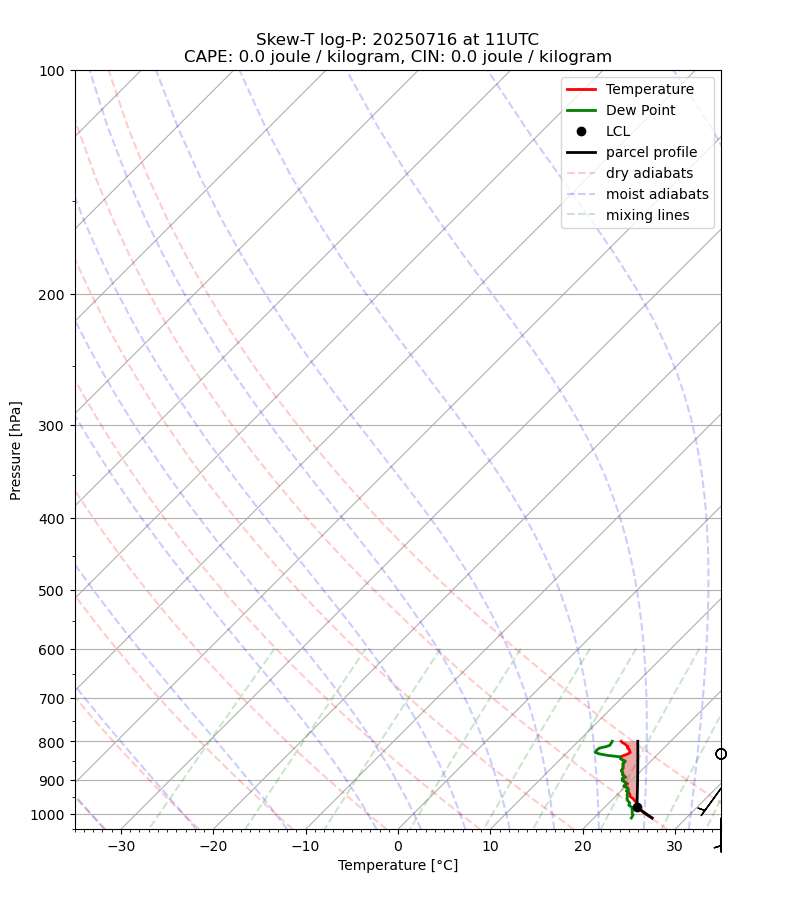

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 298.65000000000003, 298.51, 298.25, 298.17]
pressure: [101396, 100532, 100342, 100104, 100000]
dewpointTemperature: [297.2, 297.07, 297.02, 296.87, 296.82]
windDirection: [180, 162, 162, 164, 166]
windSpeed: [5.5, 4.6000000000000005, 5.1000000000000005, 5.6000000000000005, 5.7]


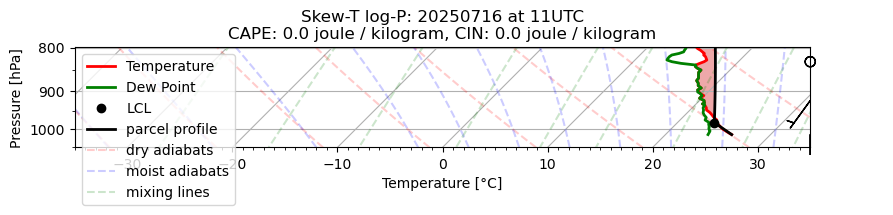

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.35, 298.84000000000003, 298.46, 298.40000000000003, 297.91]
pressure: [101406, 100340, 100000, 99939, 99417]
dewpointTemperature: [297.25, 296.69, 296.58, 296.56, 296.48]
windDirection: [168, 163, 168, 169, 176]
windSpeed: [4.5, 3.2, 3.5, 3.5, 3.3000000000000003]
Error in CAPE/CIN calculation: zero-size array to reduction operation minimum which has no identity


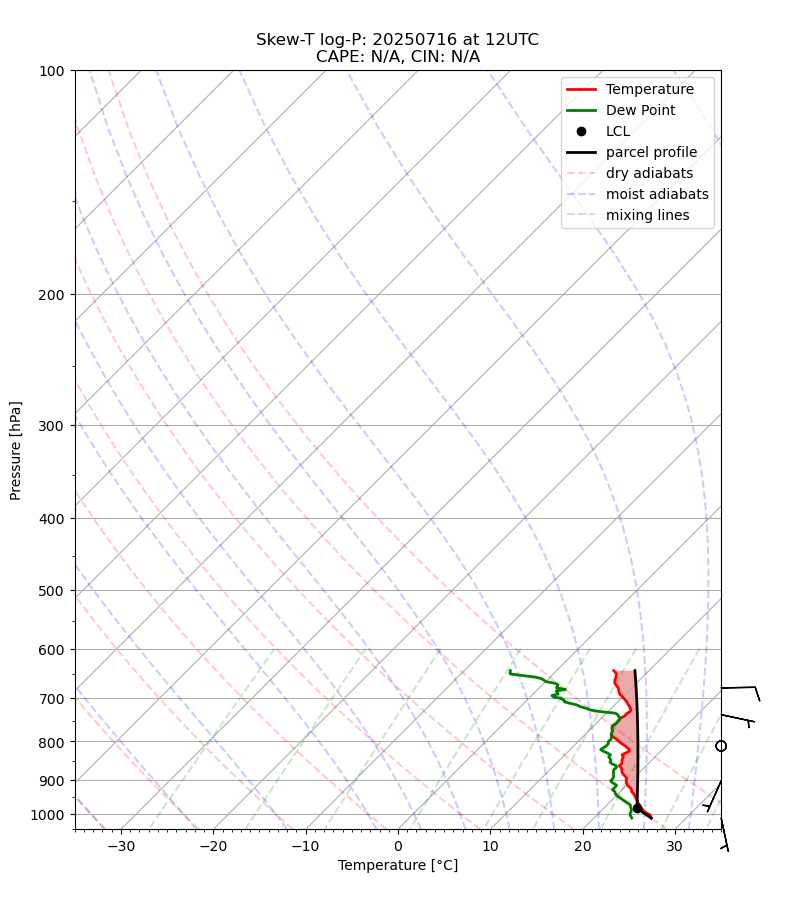

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [301.15000000000003, 298.72, 300.85, 300.45, 299.62]
pressure: [101286.0, 101116.0, 100902.0, 100539.0, 100000.0]
dewpointTemperature: [296.97, 295.08, 295.87, 295.88, 295.72]
windDirection: [210, 231, 244, 239, 230]
windSpeed: [2.0, 1.6, 1.6, 1.8, 1.7000000000000002]


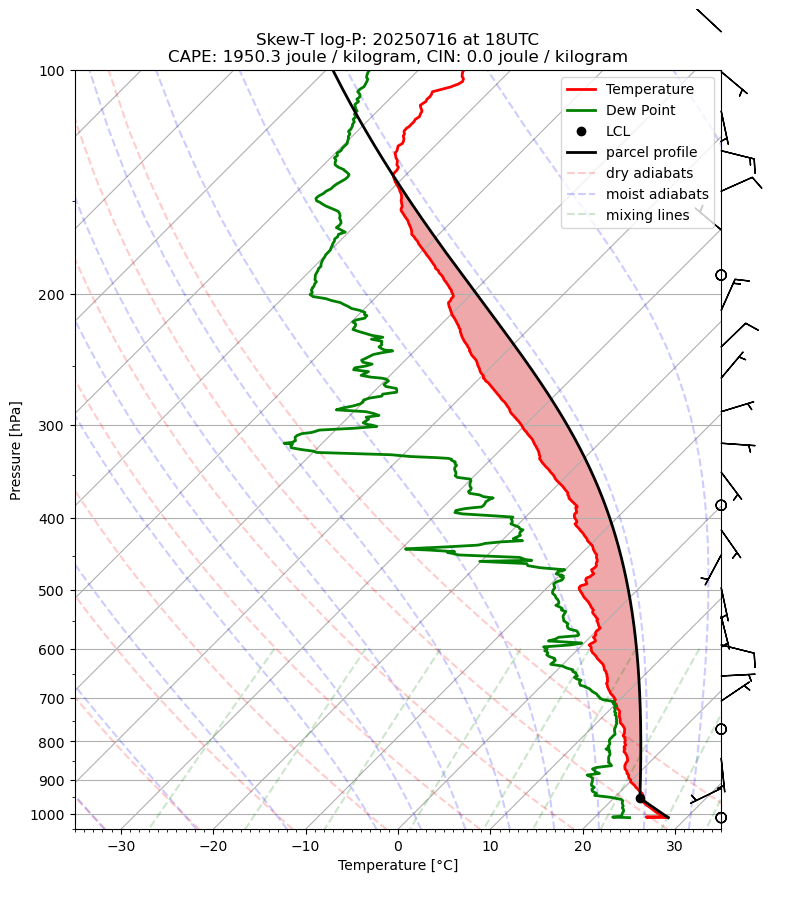

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 299.91, 299.48, 299.47, 299.11]
pressure: [101266, 100595, 100099, 100000, 99672]
dewpointTemperature: [296.13, 295.85, 295.66, 295.79, 295.84000000000003]
windDirection: [333, 321, 311, 307, 298]
windSpeed: [5.0, 3.5, 3.1, 2.8000000000000003, 2.1]


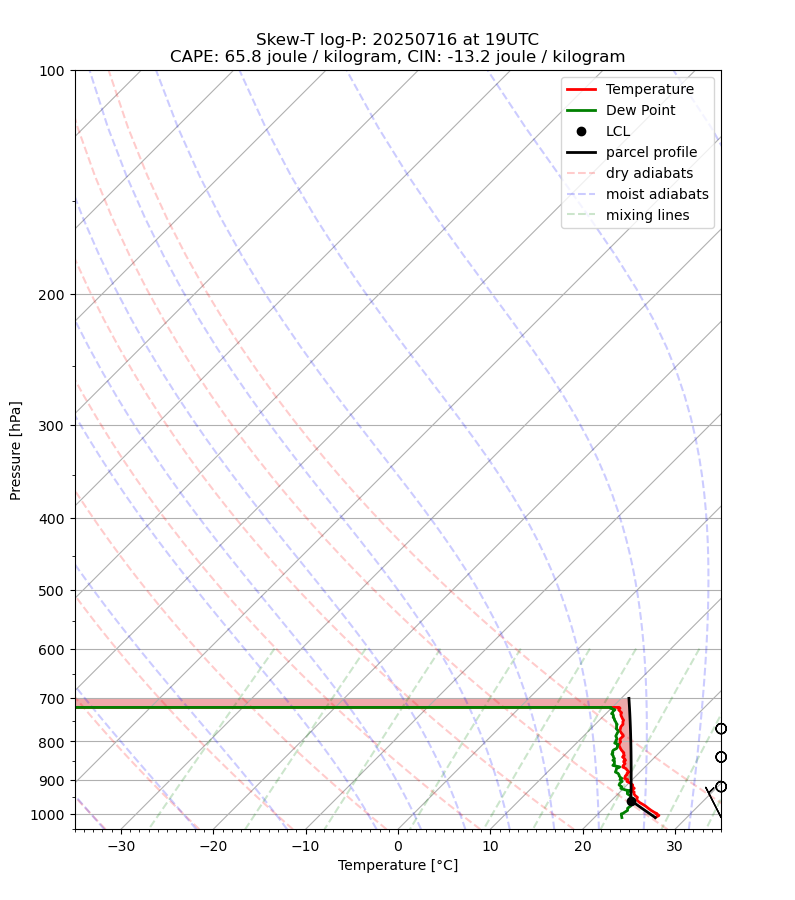

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.65000000000003, 298.98, 298.48, 298.36, 298.35]
pressure: [101266, 101054, 100460, 100000, 99976]
dewpointTemperature: [295.78000000000003, 296.75, 295.72, 295.47, 295.47]
windDirection: [316, 305, 303, 300, 300]
windSpeed: [6.0, 3.5, 4.6000000000000005, 5.0, 5.0]


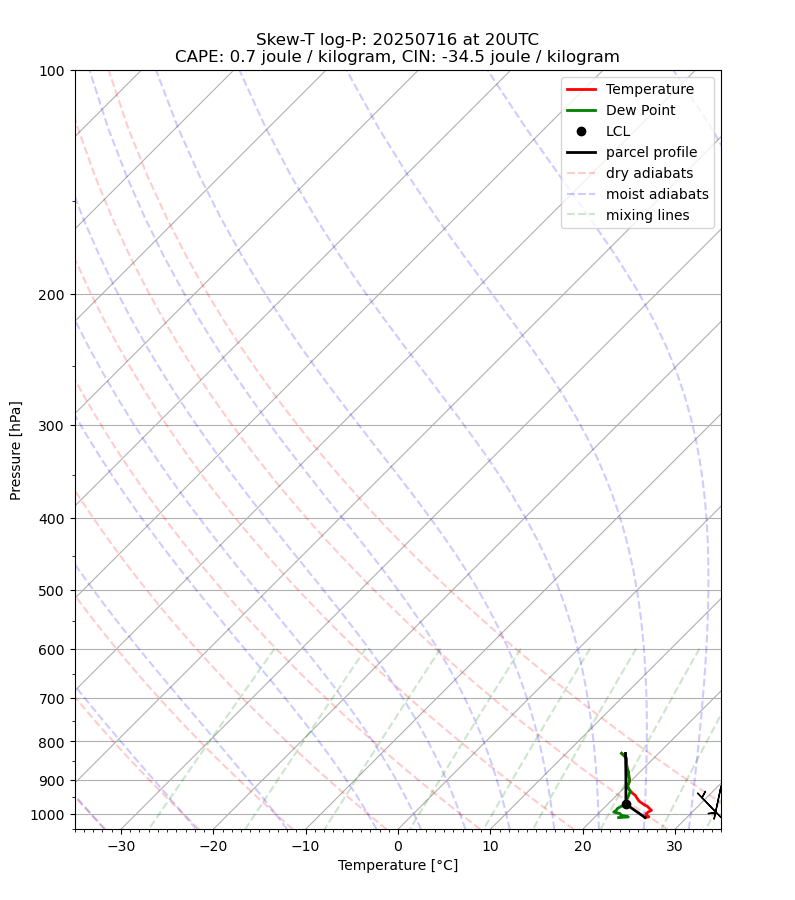

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 299.91, 299.48, 299.47, 299.11]
pressure: [101266, 100595, 100099, 100000, 99672]
dewpointTemperature: [296.13, 295.85, 295.66, 295.79, 295.84000000000003]
windDirection: [333, 321, 311, 307, 298]
windSpeed: [5.0, 3.5, 3.1, 2.8000000000000003, 2.1]


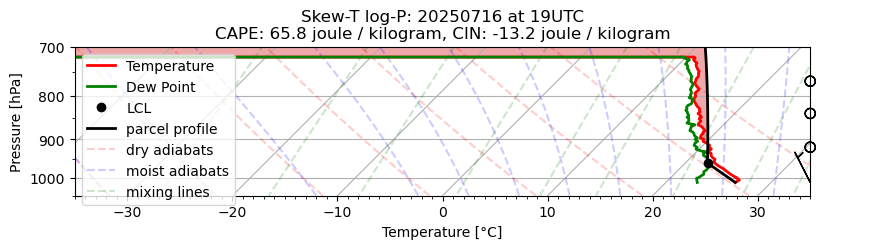

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.65000000000003, 298.98, 298.48, 298.36, 298.35]
pressure: [101266, 101054, 100460, 100000, 99976]
dewpointTemperature: [295.78000000000003, 296.75, 295.72, 295.47, 295.47]
windDirection: [316, 305, 303, 300, 300]
windSpeed: [6.0, 3.5, 4.6000000000000005, 5.0, 5.0]


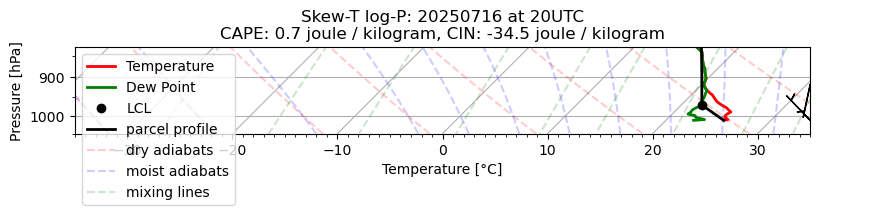

In [43]:
plot_SkewT_logP("20250616", "12UTC", True)
plot_SkewT_logP("20250622", "12UTC", True)
plot_SkewT_logP("20250623", "12UTC", True)
plot_SkewT_logP("20250625", "12UTC", True)
plot_SkewT_logP("20250626", "12UTC", True)
plot_SkewT_logP("20250627", "12UTC", True)
plot_SkewT_logP("20250628", "12UTC", True)
plot_SkewT_logP("20250629", "12UTC", True)
plot_SkewT_logP("20250630", "12UTC", True)
plot_SkewT_logP("20250701", "12UTC", True)
plot_SkewT_logP("20250702", "12UTC", True)
plot_SkewT_logP("20250703", "12UTC", True)
plot_SkewT_logP("20250704", "12UTC", True)
plot_SkewT_logP("20250705", "12UTC", True)
plot_SkewT_logP("20250706", "12UTC", True)
plot_SkewT_logP("20250707", "12UTC", True)
plot_SkewT_logP("20250708", "12UTC", True)

plot_SkewT_logP("20250709", "12UTC", True)
plot_SkewT_logP("20250709", "21UTC", True)
plot_SkewT_logP("20250709", "21UTC", False)

plot_SkewT_logP("20250710", "12UTC", True)

plot_SkewT_logP("20250711", "12UTC", True)
plot_SkewT_logP("20250711", "13UTC", True)

plot_SkewT_logP("20250712", "12UTC", True)

plot_SkewT_logP("20250713", "10UTC", True)
plot_SkewT_logP("20250713", "10UTC", False)
plot_SkewT_logP("20250713", "11UTC", True)
plot_SkewT_logP("20250713", "11UTC", False)
plot_SkewT_logP("20250713", "12UTC", True)
plot_SkewT_logP("20250713", "12UTC", False)

plot_SkewT_logP("20250714", "12UTC", True)
plot_SkewT_logP("20250715", "12UTC", True)

plot_SkewT_logP("20250716", "10UTC", True)
plot_SkewT_logP("20250716", "10UTC", False)
plot_SkewT_logP("20250716", "11UTC", True)
plot_SkewT_logP("20250716", "11UTC", False)
plot_SkewT_logP("20250716", "12UTC", True)

plot_SkewT_logP("20250716", "18UTC", True)
plot_SkewT_logP("20250716", "19UTC", True)
plot_SkewT_logP("20250716", "20UTC", True)
plot_SkewT_logP("20250716", "19UTC", False)
plot_SkewT_logP("20250716", "20UTC", False)

## Function for comparing two radiosonde profiles

In [17]:
# comparison of multiple profiles
def compare2(date_sounding1, time_sounding_utc1, date_sounding2, time_sounding_utc2):

    data1 = get_data(date_sounding1, time_sounding_utc1)
    data2 = get_data(date_sounding2, time_sounding_utc2)
    
    # Plot
    fig = plt.figure(figsize=(9, 9))
    skew = SkewT(fig, rotation=45)
    
    skew.plot(data1["p"], data1["T"], 'r', linewidth=2, label='Temperature 1')
    skew.plot(data1["p"], data1["Td"], 'g', linewidth=2, label='Dew Point 1')
    # skew.plot_barbs(pressure_barb, u_barb, v_barb)
    
    skew.plot(data2["p"], data2["T"], 'pink', linewidth=2, label='Temperature 2')
    skew.plot(data2["p"], data2["Td"], 'lawngreen', linewidth=2, label='Dew Point 2')
    
    skew.ax.set_ylim(1050, min(min(data1["p"]), min(data2["p"])))
    skew.ax.set_xlim(-35, 35)
    skew.ax.grid(True)
    
    skew.ax.xaxis.set_major_locator(MultipleLocator(10))
    skew.ax.xaxis.set_minor_locator(MultipleLocator(1))

    skew.ax.yaxis.set_major_locator(MultipleLocator(100))
    skew.ax.yaxis.set_minor_locator(MultipleLocator(50))
    
    # Add the relevant special lines
    skew.plot_dry_adiabats(label='dry adiabats', alpha=0.2)
    skew.plot_moist_adiabats(label='moist adiabats', alpha=0.2)
    skew.plot_mixing_lines(label='mixing lines', alpha=0.2)
    
    
    skew.ax.legend()

    plt.xlabel("Temperature [°C]")
    plt.ylabel("Pressure [hPa]")
    
    plt.title(f'Skew-T log-P: Comparison of \n {date_sounding1} at {time_sounding_utc1} (1) and {date_sounding2} at {time_sounding_utc2} (2)')

    plt.tight_layout()
    plt.savefig('weatherballoon_plots/SkewT_logP_comparison'+date_sounding1+'_'+time_sounding_utc1+'_'+date_sounding2+'_'+time_sounding_utc2+'.png')
    plt.show()

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.35, 298.3, 297.75, 297.36, 297.08]
pressure: [101576.0, 101241.0, 100831.0, 100345.0, 100000.0]
dewpointTemperature: [296.23, 296.52, 295.84000000000003, 295.59000000000003, 295.65000000000003]
windDirection: [50, 34, 42, 44, 44]
windSpeed: [8.5, 6.300000000000001, 7.4, 8.3, 8.3]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 299.02, 298.67, 298.5, 298.29]
pressure: [101406, 100670, 100248, 100000, 99700]
dewpointTemperature: [297.12, 296.40000000000003, 296.29, 296.21, 296.21]
windDirection: [50, 54, 52, 51, 50]
windSpeed: [9.0, 7.6000000000000005, 9.0, 9.0, 9.0]


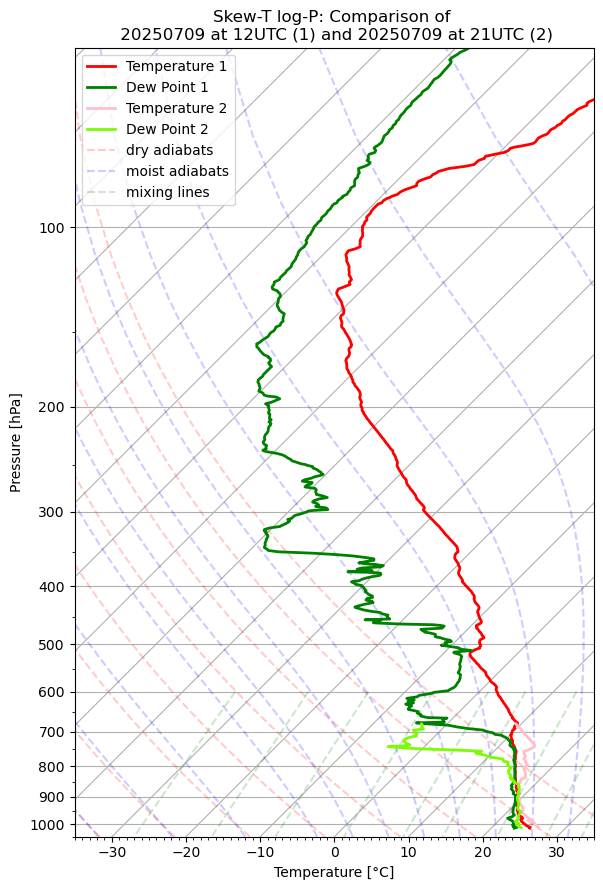

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 298.99, 298.24, 297.82, 297.71]
pressure: [101366, 100770, 100668, 100145, 100000]
dewpointTemperature: [297.88, 297.18, 296.84000000000003, 296.7, 296.77]
windDirection: [10, 15, 17, 24, 25]
windSpeed: [7.5, 6.4, 6.4, 6.5, 6.6000000000000005]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 298.76, 298.29, 298.23, 297.71]
pressure: [101406.0, 100491.0, 100000.0, 99910.0, 99353.0]
dewpointTemperature: [297.72, 297.1, 297.07, 297.04, 296.90000000000003]
windDirection: [42, 352, 349, 348, 345]
windSpeed: [3.0, 3.2, 3.3000000000000003, 3.3000000000000003, 2.6]


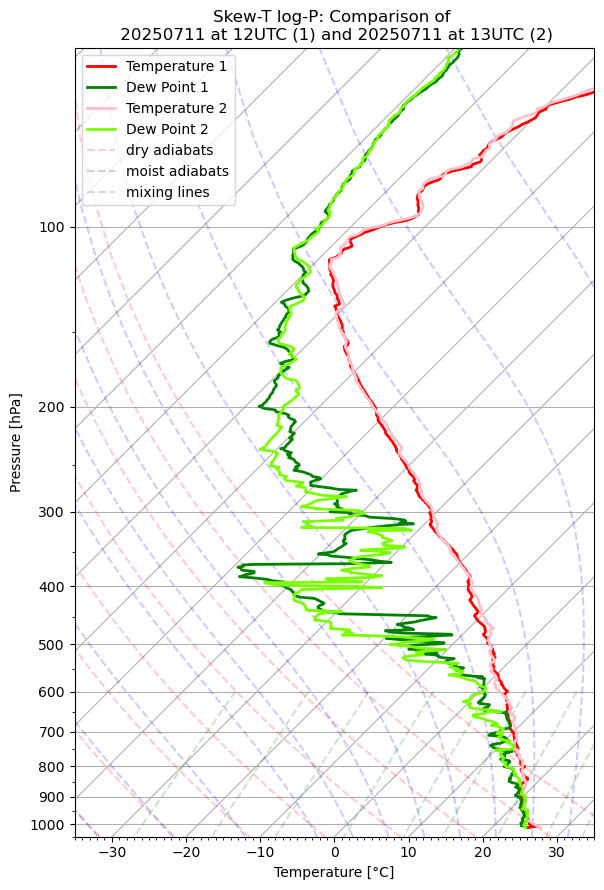

In [195]:
compare2("20250709", "12UTC", "20250709", "21UTC")
compare2("20250711", "12UTC", "20250711", "13UTC")

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.95, 297.8, 297.35, 297.13, 296.89]
pressure: [101466, 100773, 100256, 100000, 99773]
dewpointTemperature: [295.93, 295.66, 295.55, 295.5, 295.45]
windDirection: [302, 300, 302, 302, 301]
windSpeed: [4.0, 3.3000000000000003, 4.2, 4.3, 4.5]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 297.58, 297.0, 296.96, 296.54]
pressure: [101466, 100616, 100057, 100000, 99465]
dewpointTemperature: [296.81, 296.14, 295.5, 295.5, 295.12]
windDirection: [282, 271, 273, 273, 276]
windSpeed: [8.0, 5.1000000000000005, 6.0, 6.0, 6.300000000000001]


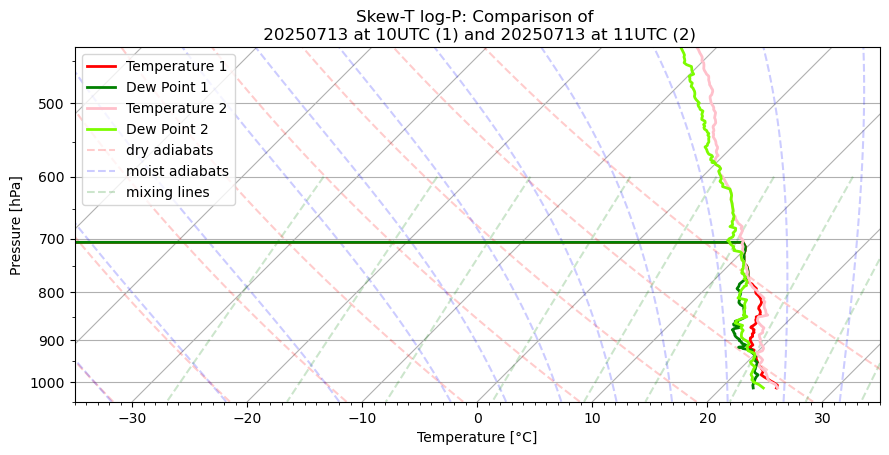

In [196]:
compare2("20250713", "10UTC", "20250713", "11UTC")

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.05, 299.6, 299.08, 299.08, 298.6]
pressure: [101386, 100596, 100000, 99999, 99537]
dewpointTemperature: [296.26, 296.04, 295.97, 295.97, 295.8]
windDirection: [207, 207, 202, 201, 201]
windSpeed: [3.0, 2.2, 2.6, 2.7, 2.7]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 298.65000000000003, 298.51, 298.25, 298.17]
pressure: [101396, 100532, 100342, 100104, 100000]
dewpointTemperature: [297.2, 297.07, 297.02, 296.87, 296.82]
windDirection: [180, 162, 162, 164, 166]
windSpeed: [5.5, 4.6000000000000005, 5.1000000000000005, 5.6000000000000005, 5.7]


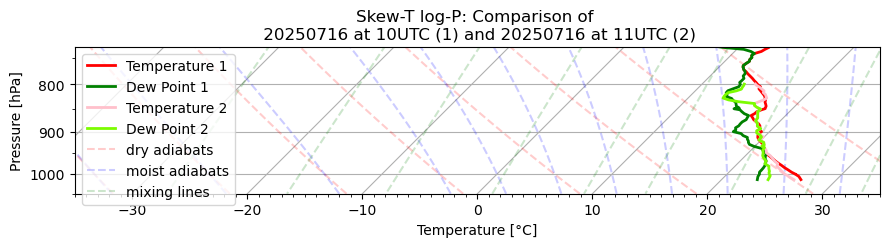

In [18]:
compare2("20250716", "10UTC", "20250716", "11UTC")

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [301.15000000000003, 298.72, 300.85, 300.45, 299.62]
pressure: [101286.0, 101116.0, 100902.0, 100539.0, 100000.0]
dewpointTemperature: [296.97, 295.08, 295.87, 295.88, 295.72]
windDirection: [210, 231, 244, 239, 230]
windSpeed: [2.0, 1.6, 1.6, 1.8, 1.7000000000000002]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 299.91, 299.48, 299.47, 299.11]
pressure: [101266, 100595, 100099, 100000, 99672]
dewpointTemperature: [296.13, 295.85, 295.66, 295.79, 295.84000000000003]
windDirection: [333, 321, 311, 307, 298]
windSpeed: [5.0, 3.5, 3.1, 2.8000000000000003, 2.1]


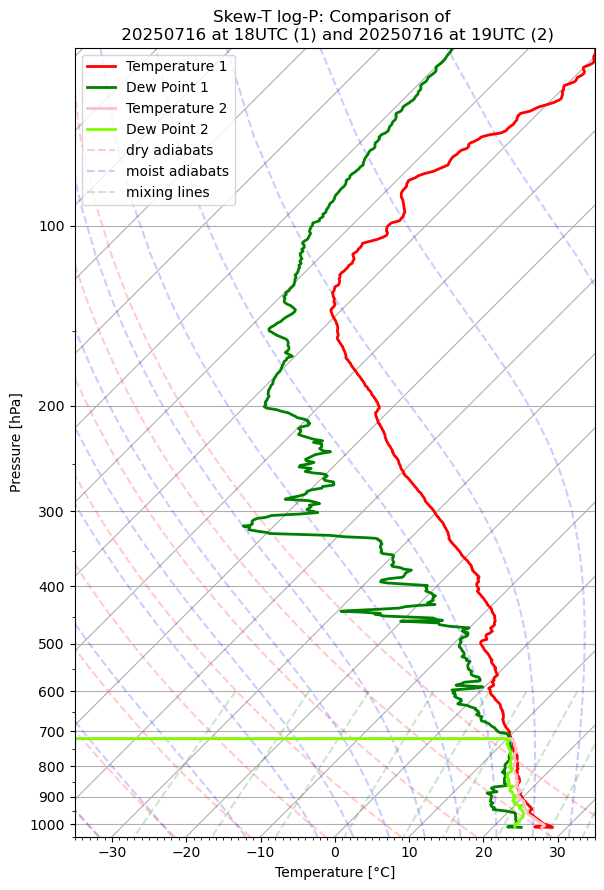

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 299.91, 299.48, 299.47, 299.11]
pressure: [101266, 100595, 100099, 100000, 99672]
dewpointTemperature: [296.13, 295.85, 295.66, 295.79, 295.84000000000003]
windDirection: [333, 321, 311, 307, 298]
windSpeed: [5.0, 3.5, 3.1, 2.8000000000000003, 2.1]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.65000000000003, 298.98, 298.48, 298.36, 298.35]
pressure: [101266, 101054, 100460, 100000, 99976]
dewpointTemperature: [295.78000000000003, 296.75, 295.72, 295.47, 295.47]
windDirection: [316, 305, 303, 300, 300]
windSpeed: [6.0, 3.5, 4.6000000000000005, 5.0, 5.0]


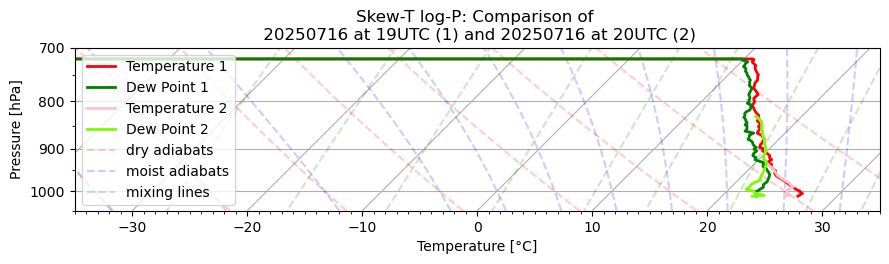

In [47]:
compare2("20250716", "18UTC", "20250716", "19UTC")
compare2("20250716", "19UTC", "20250716", "20UTC")

## Function for comparing three radiosonde profiles

In [20]:
# comparison of multiple profiles
def compare3(date_sounding1, time_sounding_utc1, date_sounding2, time_sounding_utc2, date_sounding3, time_sounding_utc3):

    data1 = get_data(date_sounding1, time_sounding_utc1)
    data2 = get_data(date_sounding2, time_sounding_utc2)
    data3 = get_data(date_sounding3, time_sounding_utc3)
    
    # Plot
    fig = plt.figure(figsize=(9, 9))
    skew = SkewT(fig, rotation=45)

    skew.plot(data1["p"], data1["T"], 'r', linewidth=2, label='Temperature 1')
    skew.plot(data1["p"], data1["Td"], 'g', linewidth=2, label='Dew Point 1')
    
    skew.plot(data2["p"], data2["T"], 'hotpink', linewidth=2, label='Temperature 2')
    skew.plot(data2["p"], data2["Td"], 'limegreen', linewidth=2, label='Dew Point 2')
    
    skew.plot(data3["p"], data3["T"], 'pink', linewidth=2, label='Temperature 3')
    skew.plot(data3["p"], data3["Td"], 'lawngreen', linewidth=2, label='Dew Point 3')
 
    skew.ax.set_ylim(1050, min(min(data1["p"]), min(data2["p"]), min(data3["p"])))
    skew.ax.set_xlim(-35, 35)
    skew.ax.grid(True)
    
    skew.ax.xaxis.set_major_locator(MultipleLocator(10))
    skew.ax.xaxis.set_minor_locator(MultipleLocator(1))

    skew.ax.yaxis.set_major_locator(MultipleLocator(100))
    skew.ax.yaxis.set_minor_locator(MultipleLocator(50))
    
    
    # Add the relevant special lines
    skew.plot_dry_adiabats(label='dry adiabats', alpha=0.2)
    skew.plot_moist_adiabats(label='moist adiabats', alpha=0.2)
    skew.plot_mixing_lines(label='mixing lines', alpha=0.2)
    
    
    skew.ax.legend()

    plt.xlabel("Temperature [°C]")
    plt.ylabel("Pressure [hPa]")
    
    plt.title(f'Skew-T log-P: Comparison of \n {date_sounding1} at {time_sounding_utc1} (1) \n {date_sounding2} at {time_sounding_utc2} (2) \n {date_sounding3} at {time_sounding_utc3} (3)')

    plt.tight_layout()
    plt.savefig('weatherballoon_plots/SkewT_logP_comparison'+date_sounding1+'_'+time_sounding_utc1+'_'+date_sounding2+'_'+time_sounding_utc2+'_'+date_sounding3+'_'+time_sounding_utc3+'.png')
    plt.show()

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.95, 297.8, 297.35, 297.13, 296.89]
pressure: [101466, 100773, 100256, 100000, 99773]
dewpointTemperature: [295.93, 295.66, 295.55, 295.5, 295.45]
windDirection: [302, 300, 302, 302, 301]
windSpeed: [4.0, 3.3000000000000003, 4.2, 4.3, 4.5]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 297.58, 297.0, 296.96, 296.54]
pressure: [101466, 100616, 100057, 100000, 99465]
dewpointTemperature: [296.81, 296.14, 295.5, 295.5, 295.12]
windDirection: [282, 271, 273, 273, 276]
windSpeed: [8.0, 5.1000000000000005, 6.0, 6.0, 6.300000000000001]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [296.65000000000003, 296.63, 296.31, 296.06, 296.04]
pressure: [101586, 100823, 100363, 100000, 99921]
dewpointTemperature: [295.1, 293.82, 293.66, 293.74, 293.58]
windDirecti

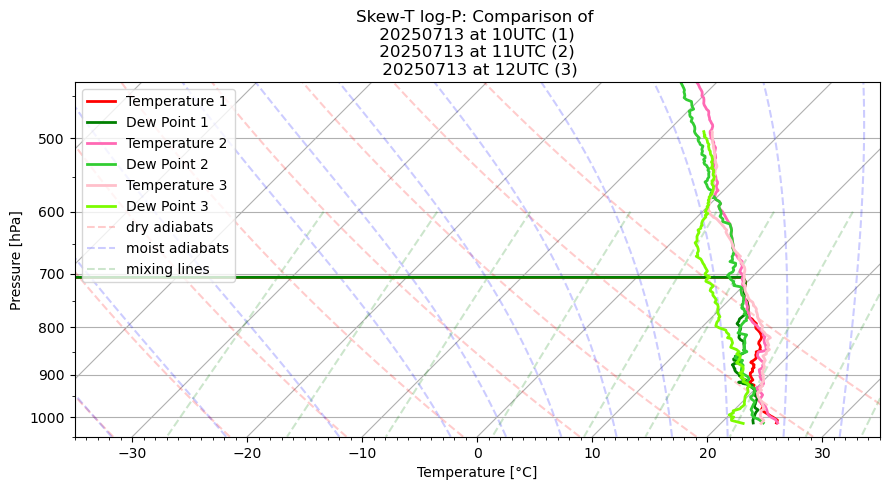

In [198]:
compare3("20250713", "10UTC", "20250713", "11UTC", "20250713", "12UTC")

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.05, 299.6, 299.08, 299.08, 298.6]
pressure: [101386, 100596, 100000, 99999, 99537]
dewpointTemperature: [296.26, 296.04, 295.97, 295.97, 295.8]
windDirection: [207, 207, 202, 201, 201]
windSpeed: [3.0, 2.2, 2.6, 2.7, 2.7]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 298.65000000000003, 298.51, 298.25, 298.17]
pressure: [101396, 100532, 100342, 100104, 100000]
dewpointTemperature: [297.2, 297.07, 297.02, 296.87, 296.82]
windDirection: [180, 162, 162, 164, 166]
windSpeed: [5.5, 4.6000000000000005, 5.1000000000000005, 5.6000000000000005, 5.7]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.35, 298.84000000000003, 298.46, 298.40000000000003, 297.91]
pressure: [101406, 100340, 100000, 99939, 99417]
dewpointTemperature: [297.25, 296.69, 296.58, 2

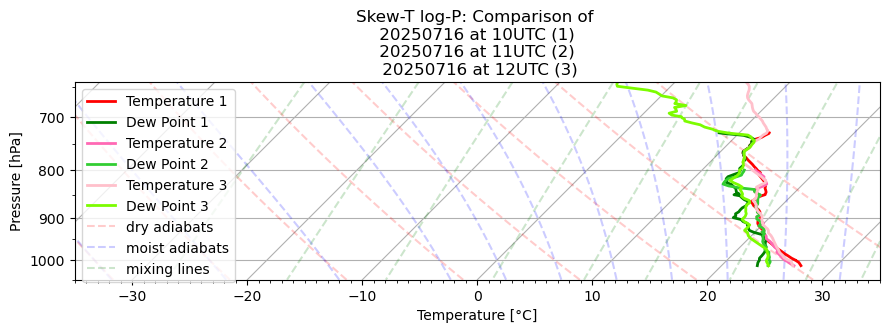

In [21]:
compare3("20250716", "10UTC", "20250716", "11UTC", "20250716", "12UTC", )

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [301.15000000000003, 298.72, 300.85, 300.45, 299.62]
pressure: [101286.0, 101116.0, 100902.0, 100539.0, 100000.0]
dewpointTemperature: [296.97, 295.08, 295.87, 295.88, 295.72]
windDirection: [210, 231, 244, 239, 230]
windSpeed: [2.0, 1.6, 1.6, 1.8, 1.7000000000000002]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 299.91, 299.48, 299.47, 299.11]
pressure: [101266, 100595, 100099, 100000, 99672]
dewpointTemperature: [296.13, 295.85, 295.66, 295.79, 295.84000000000003]
windDirection: [333, 321, 311, 307, 298]
windSpeed: [5.0, 3.5, 3.1, 2.8000000000000003, 2.1]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.65000000000003, 298.98, 298.48, 298.36, 298.35]
pressure: [101266, 101054, 100460, 100000, 99976]
dewpointTemperature: [295.78000000000003, 296.

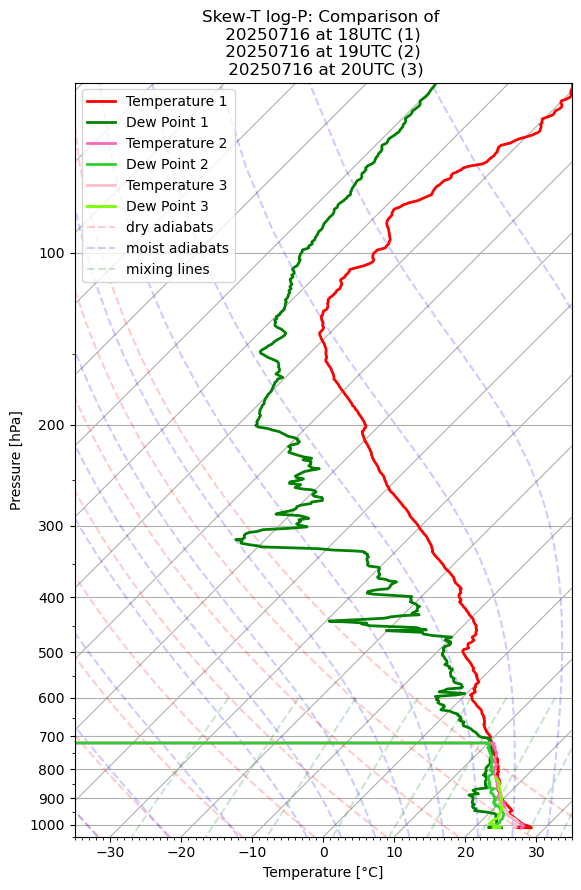

In [48]:
compare3("20250716", "18UTC", "20250716", "19UTC", "20250716", "20UTC")

# Plots for presentation

## Data from 13/07/2025

In [140]:
data1 = get_data("20250713", "10UTC")
data2 = get_data("20250713", "11UTC")

# assumes standard atmosphere
height1=mpcalc.pressure_to_height_std(data1["p"])
height2=mpcalc.pressure_to_height_std(data2["p"])

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [297.95, 297.8, 297.35, 297.13, 296.89]
pressure: [101466, 100773, 100256, 100000, 99773]
dewpointTemperature: [295.93, 295.66, 295.55, 295.5, 295.45]
windDirection: [302, 300, 302, 302, 301]
windSpeed: [4.0, 3.3000000000000003, 4.2, 4.3, 4.5]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.05, 297.58, 297.0, 296.96, 296.54]
pressure: [101466, 100616, 100057, 100000, 99465]
dewpointTemperature: [296.81, 296.14, 295.5, 295.5, 295.12]
windDirection: [282, 271, 273, 273, 276]
windSpeed: [8.0, 5.1000000000000005, 6.0, 6.0, 6.300000000000001]


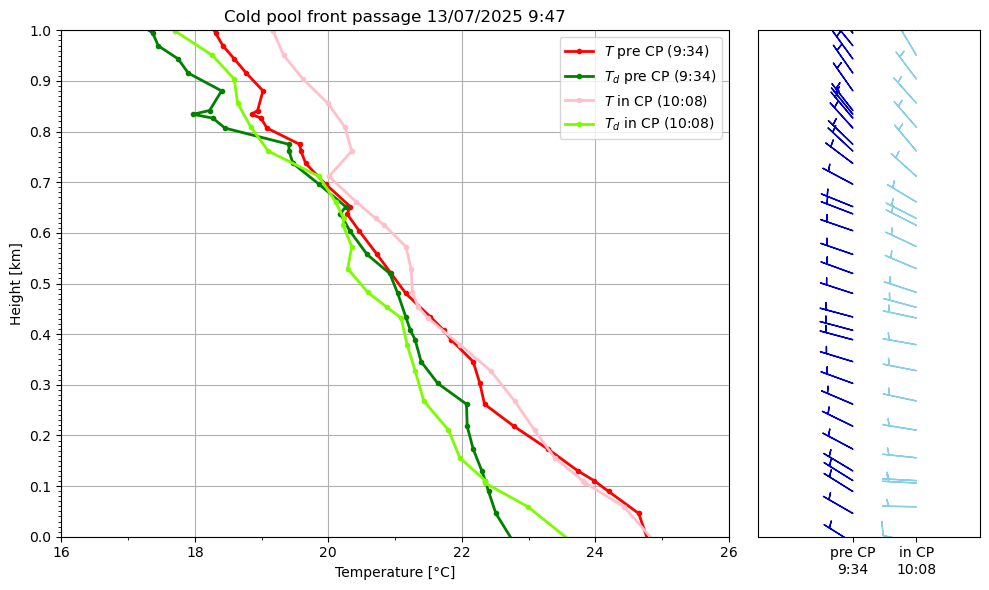

In [141]:
# Plot
fig, ax = plt.subplots(1,2, figsize=(10,6), gridspec_kw={'width_ratios': [3, 1]})

# last value is wrong, so leave it out
ax[0].plot(data1["T"][:-1], height1[:-1], 'r', linewidth=2, label=r'$T$ pre CP (9:34)', marker=".")
ax[0].plot(data1["Td"][:-1], height1[:-1], 'g', linewidth=2, label=r'$T_d$ pre CP (9:34)', marker=".")
    
ax[0].plot(data2["T"], height2, 'pink', linewidth=2, label=r'$T$ in CP (10:08)', marker=".")
ax[0].plot(data2["Td"], height2, 'lawngreen', linewidth=2, label=r'$T_d$ in CP (10:08)', marker=".")

ax[0].set_xlim(16,26)
ax[0].grid(True)

ax[0].xaxis.set_major_locator(MultipleLocator(10))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.1))
       
ax[0].legend()

ax[0].set_xlabel("Temperature [°C]")
ax[0].set_ylabel("Height [km]")
ax[0].set_ylim(0, 1)
ax[0].xaxis.set_major_locator(MultipleLocator(2))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.01))
    

ax[0].set_title(f'Cold pool front passage 13/07/2025 9:47')

ax[1].barbs([0]*len(height1), height1, data1["u_wind"], data1["v_wind"], color="mediumblue")
ax[1].barbs([1]*len(height2), height2, data2["u_wind"], data2["v_wind"], color="skyblue")
ax[1].set_xlim(-1.5, 2)
ax[1].set_xticks([0, 1])
ax[1].set_xticklabels(["pre CP\n9:34", "in CP\n10:08"])
ax[1].set_ylim(0, 1)
ax[1].set_yticks([])
ax[1].yaxis.set_ticklabels([])
ax[1].set_ylabel('')


plt.tight_layout()
plt.savefig('weatherballoon_plots/20250713_presentation.png')
plt.show()

## Data from 16/07/2025 CP 1

In [142]:
data1 = get_data("20250716", "10UTC")
data2 = get_data("20250716", "11UTC")
data3 = get_data("20250716", "12UTC")

# assumes standard atmosphere
height1=mpcalc.pressure_to_height_std(data1["p"])
height2=mpcalc.pressure_to_height_std(data2["p"])
height3=mpcalc.pressure_to_height_std(data3["p"])

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.05, 299.6, 299.08, 299.08, 298.6]
pressure: [101386, 100596, 100000, 99999, 99537]
dewpointTemperature: [296.26, 296.04, 295.97, 295.97, 295.8]
windDirection: [207, 207, 202, 201, 201]
windSpeed: [3.0, 2.2, 2.6, 2.7, 2.7]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.45, 298.65000000000003, 298.51, 298.25, 298.17]
pressure: [101396, 100532, 100342, 100104, 100000]
dewpointTemperature: [297.2, 297.07, 297.02, 296.87, 296.82]
windDirection: [180, 162, 162, 164, 166]
windSpeed: [5.5, 4.6000000000000005, 5.1000000000000005, 5.6000000000000005, 5.7]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.35, 298.84000000000003, 298.46, 298.40000000000003, 297.91]
pressure: [101406, 100340, 100000, 99939, 99417]
dewpointTemperature: [297.25, 296.69, 296.58, 2

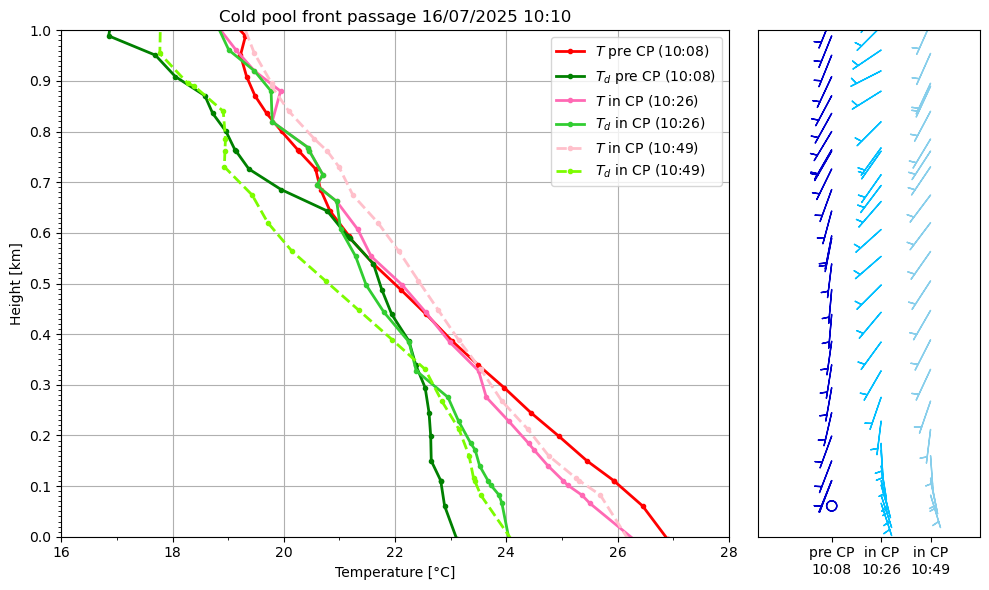

In [143]:
# Plot
fig, ax = plt.subplots(1,2, figsize=(10,6), gridspec_kw={'width_ratios': [3, 1]})

# last value is wrong, so leave it out
ax[0].plot(data1["T"][:-1], height1[:-1], 'r', linewidth=2, label=r'$T$ pre CP (10:08)', marker=".")
ax[0].plot(data1["Td"][:-1], height1[:-1], 'g', linewidth=2, label=r'$T_d$ pre CP (10:08)', marker=".")
    
ax[0].plot(data2["T"], height2, 'hotpink', linewidth=2, label=r'$T$ in CP (10:26)', marker=".")
ax[0].plot(data2["Td"], height2, 'limegreen', linewidth=2, label=r'$T_d$ in CP (10:26)', marker=".")

ax[0].plot(data3["T"], height3, 'pink', linewidth=2, label=r'$T$ in CP (10:49)', marker=".", linestyle="--")
ax[0].plot(data3["Td"], height3, 'lawngreen', linewidth=2, label=r'$T_d$ in CP (10:49)', marker=".", linestyle="--")

ax[0].set_xlim(16,28)
ax[0].grid(True)

ax[0].xaxis.set_major_locator(MultipleLocator(10))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.1))
       
ax[0].legend()

ax[0].set_xlabel("Temperature [°C]")
ax[0].set_ylabel("Height [km]")
ax[0].set_ylim(0, 1)
ax[0].xaxis.set_major_locator(MultipleLocator(2))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.01))
    

ax[0].set_title(f'Cold pool front passage 16/07/2025 10:10')

ax[1].barbs([0]*len(height1), height1, data1["u_wind"], data1["v_wind"], color="mediumblue")
ax[1].barbs([1]*len(height2), height2, data2["u_wind"], data2["v_wind"], color="deepskyblue")
ax[1].barbs([2]*len(height3), height3, data3["u_wind"], data3["v_wind"], color="skyblue")
ax[1].set_xlim(-1.5, 3)
ax[1].set_xticks([0, 1, 2])
ax[1].set_xticklabels(["pre CP\n10:08", "in CP\n10:26", "in CP\n10:49"])
ax[1].set_ylim(0, 1)
ax[1].set_yticks([])
ax[1].yaxis.set_ticklabels([])
ax[1].set_ylabel('')


plt.tight_layout()
plt.savefig('weatherballoon_plots/20250716-1_presentation.png')
plt.show()

## Data from 16/07/2025 CP 2

In [144]:
data1 = get_data("20250716", "18UTC")
data2 = get_data("20250716", "19UTC")
data3 = get_data("20250716", "20UTC")

# assumes standard atmosphere
height1=mpcalc.pressure_to_height_std(data1["p"])
height2=mpcalc.pressure_to_height_std(data2["p"])
height3=mpcalc.pressure_to_height_std(data3["p"])

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [301.15000000000003, 298.72, 300.85, 300.45, 299.62]
pressure: [101286.0, 101116.0, 100902.0, 100539.0, 100000.0]
dewpointTemperature: [296.97, 295.08, 295.87, 295.88, 295.72]
windDirection: [210, 231, 244, 239, 230]
windSpeed: [2.0, 1.6, 1.6, 1.8, 1.7000000000000002]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [299.75, 299.91, 299.48, 299.47, 299.11]
pressure: [101266, 100595, 100099, 100000, 99672]
dewpointTemperature: [296.13, 295.85, 295.66, 295.79, 295.84000000000003]
windDirection: [333, 321, 311, 307, 298]
windSpeed: [5.0, 3.5, 3.1, 2.8000000000000003, 2.1]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [298.65000000000003, 298.98, 298.48, 298.36, 298.35]
pressure: [101266, 101054, 100460, 100000, 99976]
dewpointTemperature: [295.78000000000003, 296.

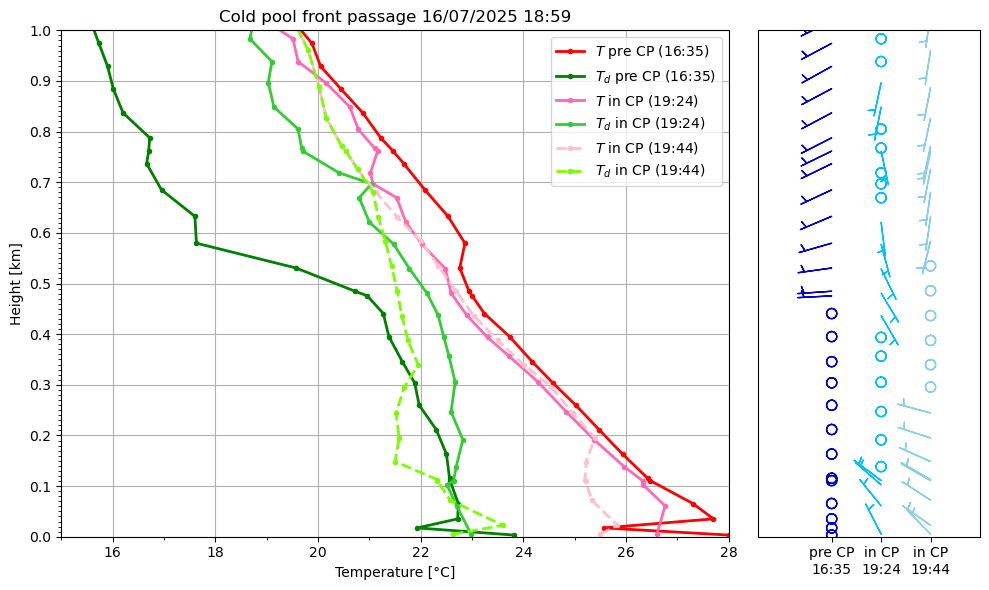

In [145]:
# Plot
fig, ax = plt.subplots(1,2, figsize=(10,6), gridspec_kw={'width_ratios': [3, 1]})

# last value is wrong, so leave it out
ax[0].plot(data1["T"][:-1], height1[:-1], 'r', linewidth=2, label=r'$T$ pre CP (16:35)', marker=".")
ax[0].plot(data1["Td"][:-1], height1[:-1], 'g', linewidth=2, label=r'$T_d$ pre CP (16:35)', marker=".")
    
ax[0].plot(data2["T"], height2, 'hotpink', linewidth=2, label=r'$T$ in CP (19:24)', marker=".")
ax[0].plot(data2["Td"], height2, 'limegreen', linewidth=2, label=r'$T_d$ in CP (19:24)', marker=".")

ax[0].plot(data3["T"], height3, 'pink', linewidth=2, label=r'$T$ in CP (19:44)', marker=".", linestyle="--")
ax[0].plot(data3["Td"], height3, 'lawngreen', linewidth=2, label=r'$T_d$ in CP (19:44)', marker=".", linestyle="--")

ax[0].set_xlim(15,28)
ax[0].grid(True)

ax[0].xaxis.set_major_locator(MultipleLocator(10))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.1))
       
ax[0].legend()

ax[0].set_xlabel("Temperature [°C]")
ax[0].set_ylabel("Height [km]")
ax[0].set_ylim(0, 1)
ax[0].xaxis.set_major_locator(MultipleLocator(2))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.01))
    

ax[0].set_title(f'Cold pool front passage 16/07/2025 18:59')

ax[1].barbs([0]*len(height1), height1, data1["u_wind"], data1["v_wind"], color="mediumblue")
ax[1].barbs([1]*len(height2), height2, data2["u_wind"], data2["v_wind"], color="deepskyblue")
ax[1].barbs([2]*len(height3), height3, data3["u_wind"], data3["v_wind"], color="skyblue")
ax[1].set_xlim(-1.5, 3)
ax[1].set_xticks([0, 1, 2])
ax[1].set_xticklabels(["pre CP\n16:35", "in CP\n19:24", "in CP\n19:44"])
ax[1].set_ylim(0, 1)
ax[1].set_yticks([])
ax[1].yaxis.set_ticklabels([])
ax[1].set_ylabel('')


plt.tight_layout()
plt.savefig('weatherballoon_plots/20250716-2_presentation.png')
plt.show()

## Data from 17/07/2025

In [146]:
data1 = get_data("20250717", "15UTC")
data2 = get_data("20250717", "18UTC")

# assumes standard atmosphere
height1=mpcalc.pressure_to_height_std(data1["p"])
height2=mpcalc.pressure_to_height_std(data2["p"])

C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.75, 300.31, 299.76, 299.64, 299.3]
pressure: [101386, 100634, 100069, 100000, 99628]
dewpointTemperature: [296.67, 296.34000000000003, 296.1, 296.0, 295.94]
windDirection: [180, 194, 196, 196, 196]
windSpeed: [2.5, 2.2, 2.8000000000000003, 2.9000000000000004, 2.8000000000000003]
C:\Users\lotta\OneDrive\Dokumente\CLEWS_Uni_Potsdam\Masterprojekt\METEOR\GitHub\Radiosondes
airTemperature: [300.45, 299.66, 299.48, 299.34000000000003, 299.2]
pressure: [101376.0, 100679.0, 100194.0, 100000.0, 99702.0]
dewpointTemperature: [297.02, 296.59000000000003, 296.06, 296.03000000000003, 295.94]
windDirection: [269, 259, 251, 244, 237]
windSpeed: [5.0, 3.0, 3.0, 2.8000000000000003, 2.6]


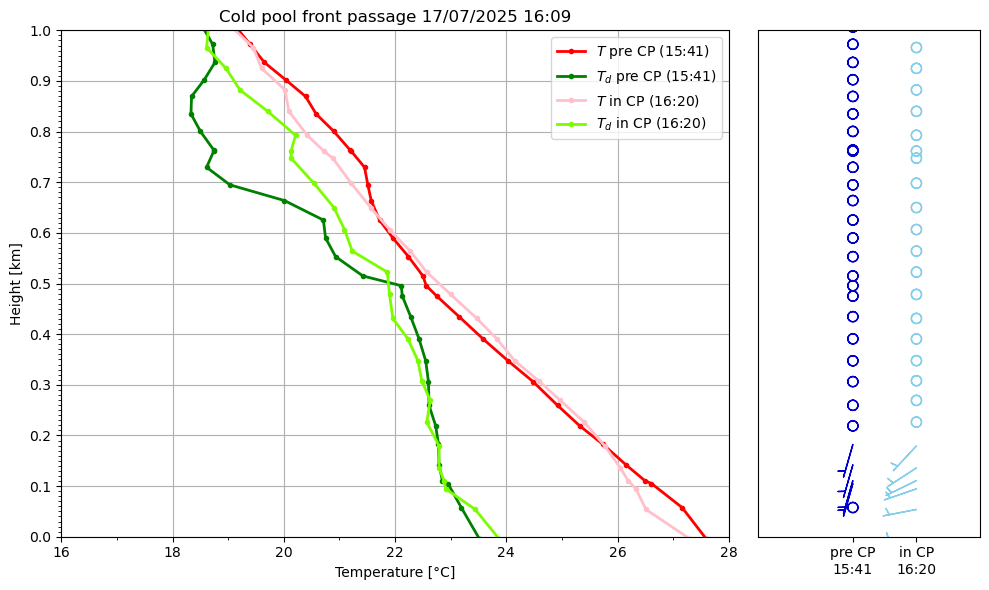

In [147]:
# Plot
fig, ax = plt.subplots(1,2, figsize=(10,6), gridspec_kw={'width_ratios': [3, 1]})

# last value is wrong, so leave it out
ax[0].plot(data1["T"][:-1], height1[:-1], 'r', linewidth=2, label=r'$T$ pre CP (15:41)', marker=".")
ax[0].plot(data1["Td"][:-1], height1[:-1], 'g', linewidth=2, label=r'$T_d$ pre CP (15:41)', marker=".")
    
ax[0].plot(data2["T"], height2, 'pink', linewidth=2, label=r'$T$ in CP (16:20)', marker=".")
ax[0].plot(data2["Td"], height2, 'lawngreen', linewidth=2, label=r'$T_d$ in CP (16:20)', marker=".")

ax[0].set_xlim(16,28)
ax[0].grid(True)

ax[0].xaxis.set_major_locator(MultipleLocator(10))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.1))
       
ax[0].legend()

ax[0].set_xlabel("Temperature [°C]")
ax[0].set_ylabel("Height [km]")
ax[0].set_ylim(0, 1)
ax[0].xaxis.set_major_locator(MultipleLocator(2))
ax[0].xaxis.set_minor_locator(MultipleLocator(1))

ax[0].yaxis.set_major_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.01))
    

ax[0].set_title(f'Cold pool front passage 17/07/2025 16:09')

ax[1].barbs([0]*len(height1), height1, data1["u_wind"], data1["v_wind"], color="mediumblue")
ax[1].barbs([1]*len(height2), height2, data2["u_wind"], data2["v_wind"], color="skyblue")
ax[1].set_xlim(-1.5, 2)
ax[1].set_xticks([0, 1])
ax[1].set_xticklabels(["pre CP\n15:41", "in CP\n16:20"])
ax[1].set_ylim(0, 1)
ax[1].set_yticks([])
ax[1].yaxis.set_ticklabels([])
ax[1].set_ylabel('')


plt.tight_layout()
plt.savefig('weatherballoon_plots/20250717_presentation.png')
plt.show()